# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

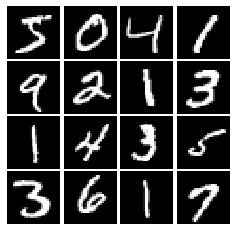

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.maximum(x, x*alpha)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256, input_shape=(784,), use_bias=True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256, use_bias=True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024, input_shape=(tf.shape(noise_dim),), use_bias=True, activation='relu'),
        tf.keras.layers.Dense(1024, use_bias=True,  activation='relu'),
        tf.keras.layers.Dense(784, use_bias=True,  activation='tanh'),
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    f_loss = tf.keras.losses.BinaryCrossentropy(True)
    loss = f_loss(tf.zeros(logits_fake.shape), logits_fake)
    loss += f_loss(tf.ones(logits_real.shape), logits_real)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    f_loss = tf.keras.losses.BinaryCrossentropy(True)
    loss = f_loss(tf.ones(logits_fake.shape), logits_fake) 

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [14]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [15]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [16]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate, beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate, beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [17]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.639, G:0.7673
Instructions for updating:
Use tf.identity instead.


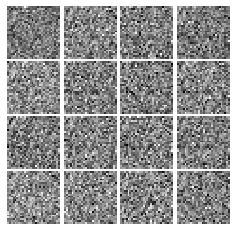

Epoch: 0, Iter: 20, D: 0.6053, G:0.8717


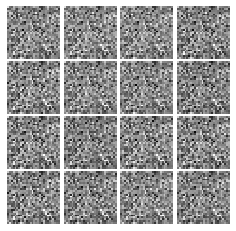

Epoch: 0, Iter: 40, D: 0.4841, G:1.032


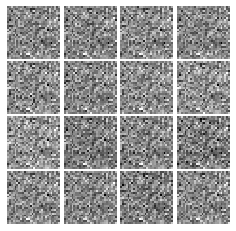

Epoch: 0, Iter: 60, D: 0.3314, G:1.904


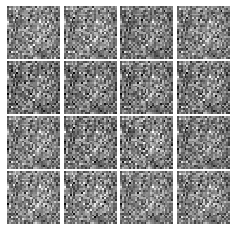

Epoch: 0, Iter: 80, D: 0.9108, G:2.809


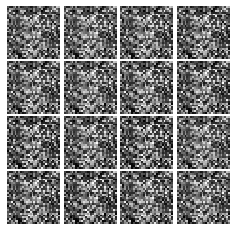

Epoch: 0, Iter: 100, D: 1.026, G:1.078


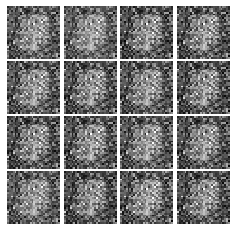

Epoch: 0, Iter: 120, D: 1.12, G:1.772


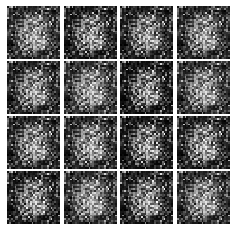

Epoch: 0, Iter: 140, D: 1.596, G:0.9761


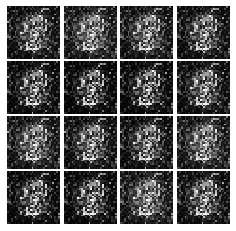

Epoch: 0, Iter: 160, D: 1.14, G:1.098


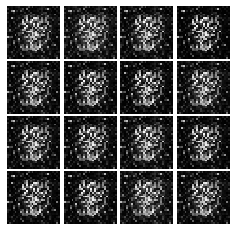

Epoch: 0, Iter: 180, D: 1.643, G:1.313


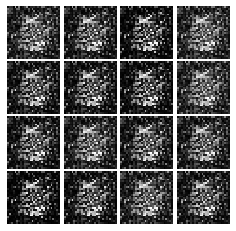

Epoch: 0, Iter: 200, D: 0.9182, G:1.661


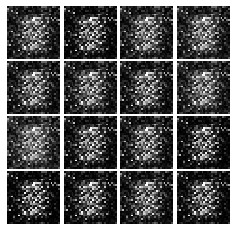

Epoch: 0, Iter: 220, D: 1.485, G:1.231


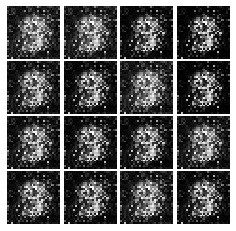

Epoch: 0, Iter: 240, D: 1.672, G:0.8691


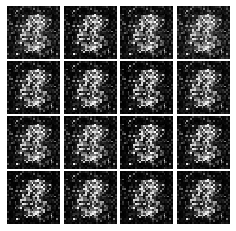

Epoch: 0, Iter: 260, D: 1.23, G:0.9738


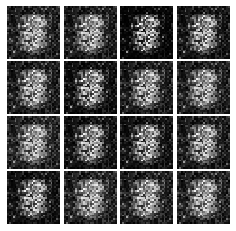

Epoch: 0, Iter: 280, D: 1.123, G:1.344


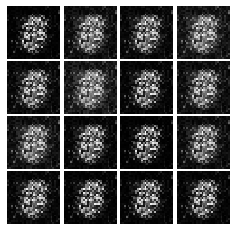

Epoch: 0, Iter: 300, D: 1.25, G:1.196


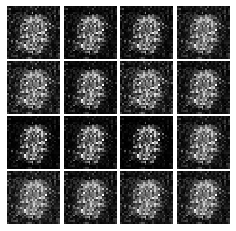

Epoch: 0, Iter: 320, D: 1.314, G:1.812


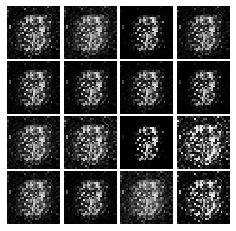

Epoch: 0, Iter: 340, D: 0.8377, G:1.766


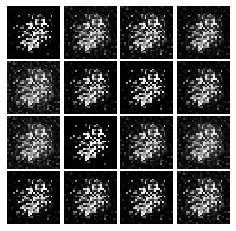

Epoch: 0, Iter: 360, D: 0.942, G:1.606


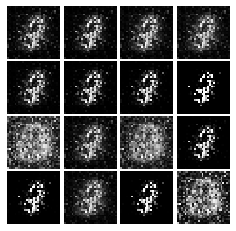

Epoch: 0, Iter: 380, D: 1.142, G:0.9144


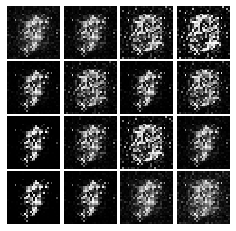

Epoch: 0, Iter: 400, D: 1.36, G:1.383


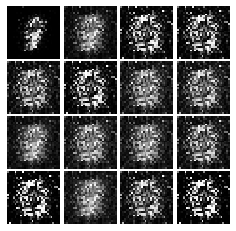

Epoch: 0, Iter: 420, D: 1.411, G:1.174


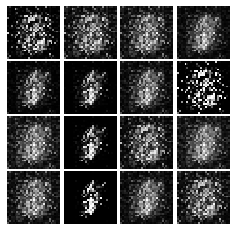

Epoch: 0, Iter: 440, D: 1.062, G:1.323


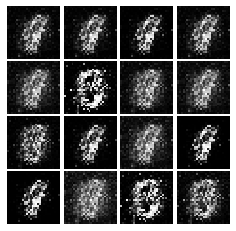

Epoch: 0, Iter: 460, D: 0.9559, G:3.12


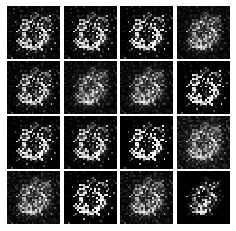

Epoch: 1, Iter: 480, D: 2.268, G:2.361


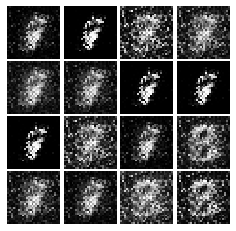

Epoch: 1, Iter: 500, D: 1.118, G:1.208


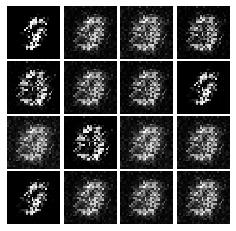

Epoch: 1, Iter: 520, D: 1.612, G:0.5841


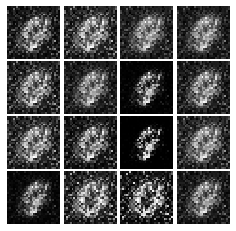

Epoch: 1, Iter: 540, D: 1.019, G:1.344


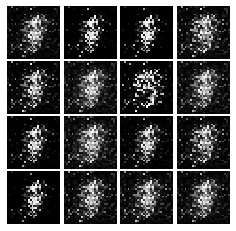

Epoch: 1, Iter: 560, D: 1.356, G:1.009


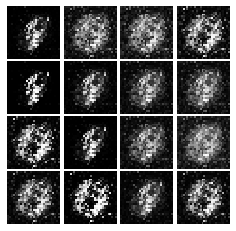

Epoch: 1, Iter: 580, D: 1.448, G:1.315


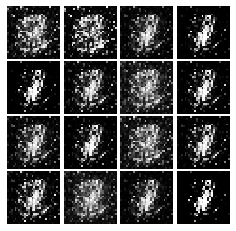

Epoch: 1, Iter: 600, D: 1.463, G:1.276


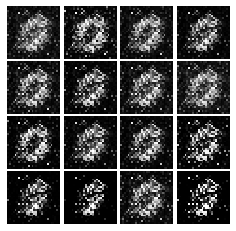

Epoch: 1, Iter: 620, D: 0.9558, G:1.739


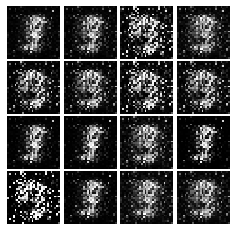

Epoch: 1, Iter: 640, D: 0.9472, G:1.183


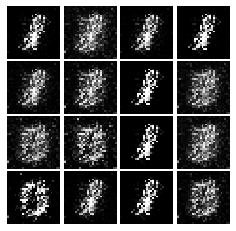

Epoch: 1, Iter: 660, D: 1.329, G:0.5904


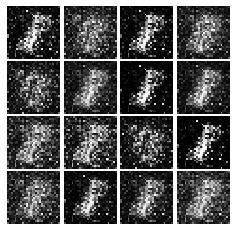

Epoch: 1, Iter: 680, D: 1.55, G:1.298


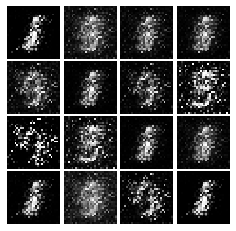

Epoch: 1, Iter: 700, D: 1.156, G:1.088


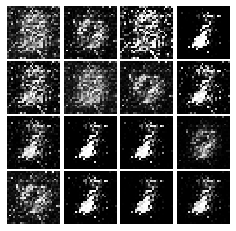

Epoch: 1, Iter: 720, D: 1.251, G:1.021


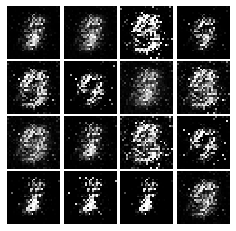

Epoch: 1, Iter: 740, D: 1.011, G:1.129


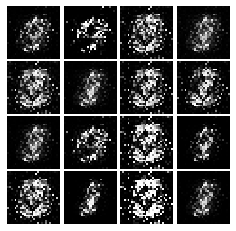

Epoch: 1, Iter: 760, D: 1.434, G:1.242


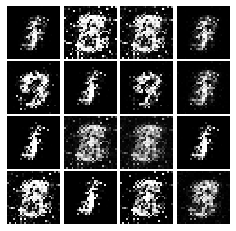

Epoch: 1, Iter: 780, D: 1.127, G:1.078


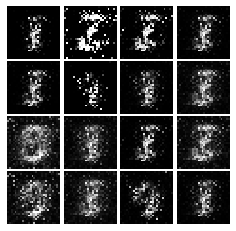

Epoch: 1, Iter: 800, D: 1.224, G:1.199


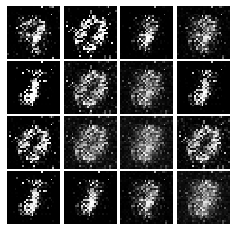

Epoch: 1, Iter: 820, D: 1.122, G:0.8882


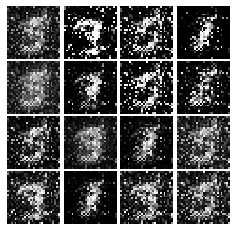

Epoch: 1, Iter: 840, D: 1.197, G:1.388


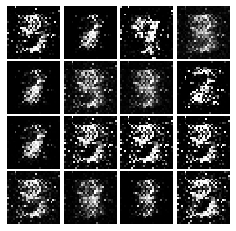

Epoch: 1, Iter: 860, D: 1.108, G:1.419


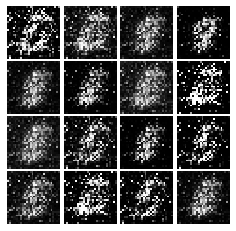

Epoch: 1, Iter: 880, D: 1.246, G:0.8701


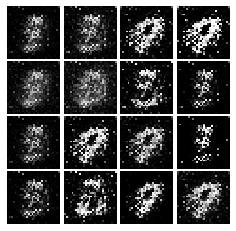

Epoch: 1, Iter: 900, D: 1.186, G:1.264


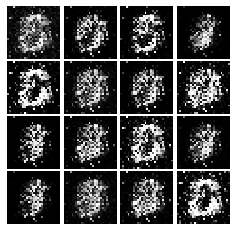

Epoch: 1, Iter: 920, D: 1.356, G:0.931


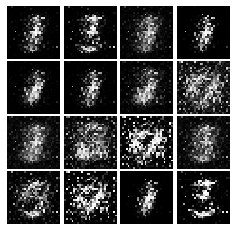

Epoch: 2, Iter: 940, D: 1.248, G:0.4392


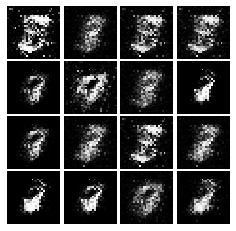

Epoch: 2, Iter: 960, D: 1.275, G:1.201


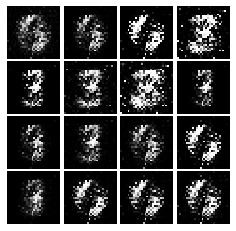

Epoch: 2, Iter: 980, D: 1.109, G:1.206


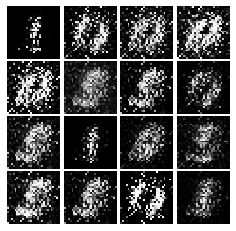

Epoch: 2, Iter: 1000, D: 1.123, G:1.342


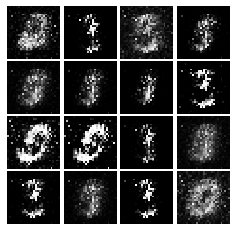

Epoch: 2, Iter: 1020, D: 1.169, G:1.008


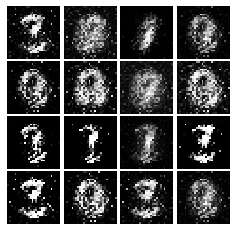

Epoch: 2, Iter: 1040, D: 1.239, G:0.9101


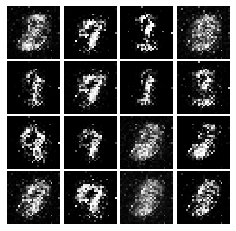

Epoch: 2, Iter: 1060, D: 1.312, G:0.7663


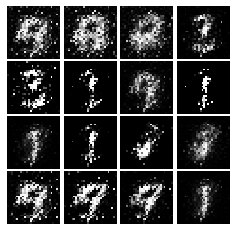

Epoch: 2, Iter: 1080, D: 1.299, G:0.9793


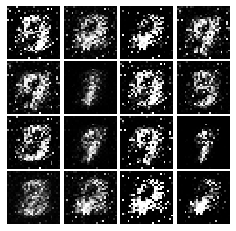

Epoch: 2, Iter: 1100, D: 1.596, G:1.541


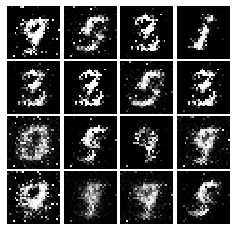

Epoch: 2, Iter: 1120, D: 1.221, G:0.7606


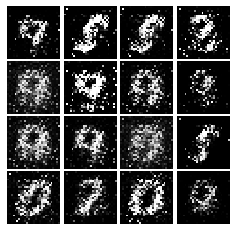

Epoch: 2, Iter: 1140, D: 1.116, G:1.227


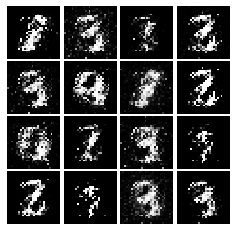

Epoch: 2, Iter: 1160, D: 1.244, G:0.7832


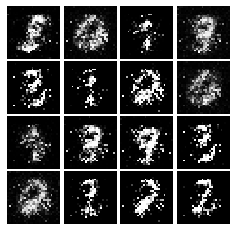

Epoch: 2, Iter: 1180, D: 0.9795, G:1.038


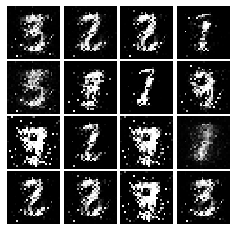

Epoch: 2, Iter: 1200, D: 1.286, G:0.9383


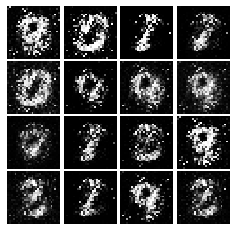

Epoch: 2, Iter: 1220, D: 1.189, G:1.233


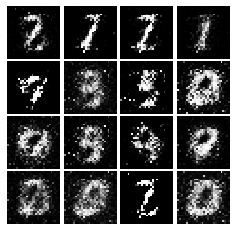

Epoch: 2, Iter: 1240, D: 1.207, G:1.515


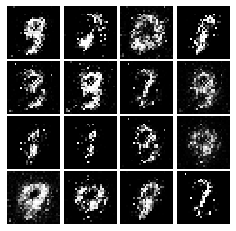

Epoch: 2, Iter: 1260, D: 1.208, G:0.8708


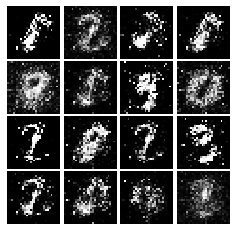

Epoch: 2, Iter: 1280, D: 1.591, G:0.1275


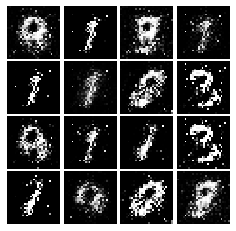

Epoch: 2, Iter: 1300, D: 1.162, G:1.077


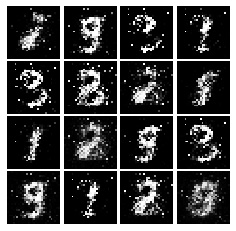

Epoch: 2, Iter: 1320, D: 1.294, G:1.055


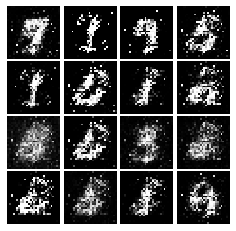

Epoch: 2, Iter: 1340, D: 1.198, G:1.415


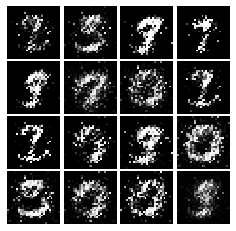

Epoch: 2, Iter: 1360, D: 1.368, G:0.703


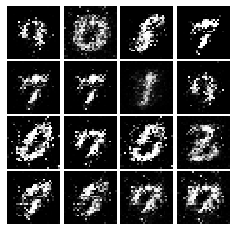

Epoch: 2, Iter: 1380, D: 1.464, G:0.8082


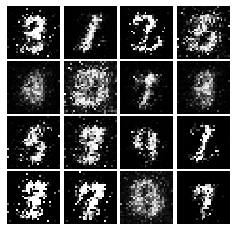

Epoch: 2, Iter: 1400, D: 1.089, G:1.133


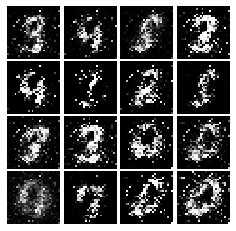

Epoch: 3, Iter: 1420, D: 1.279, G:1.085


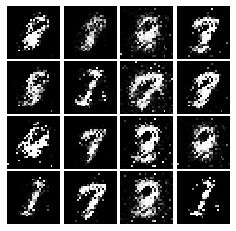

Epoch: 3, Iter: 1440, D: 1.428, G:0.8417


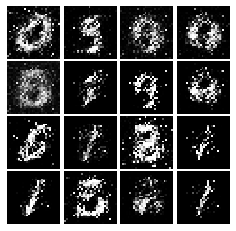

Epoch: 3, Iter: 1460, D: 1.136, G:1.327


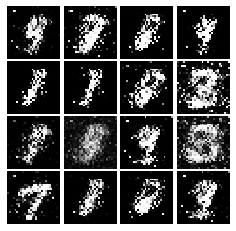

Epoch: 3, Iter: 1480, D: 1.022, G:2.149


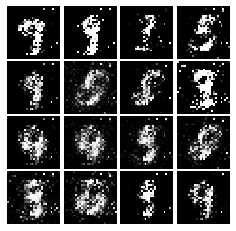

Epoch: 3, Iter: 1500, D: 1.09, G:1.079


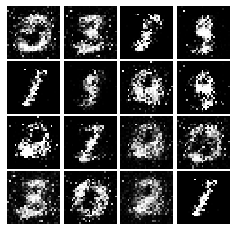

Epoch: 3, Iter: 1520, D: 1.016, G:1.031


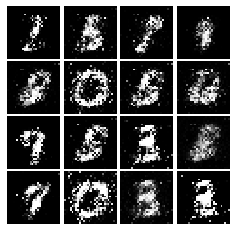

Epoch: 3, Iter: 1540, D: 1.155, G:0.9377


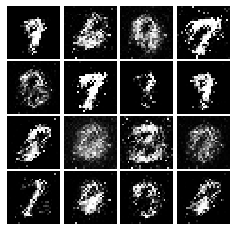

Epoch: 3, Iter: 1560, D: 1.134, G:1.343


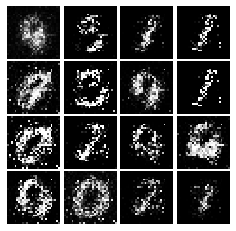

Epoch: 3, Iter: 1580, D: 1.697, G:1.166


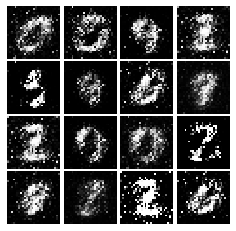

Epoch: 3, Iter: 1600, D: 1.281, G:0.9131


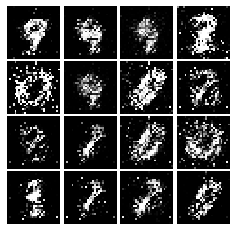

Epoch: 3, Iter: 1620, D: 2.507, G:0.0652


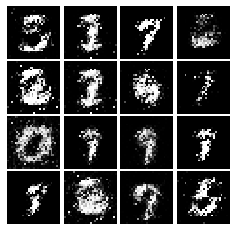

Epoch: 3, Iter: 1640, D: 1.263, G:1.005


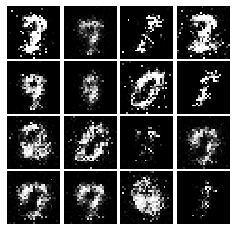

Epoch: 3, Iter: 1660, D: 1.29, G:0.9576


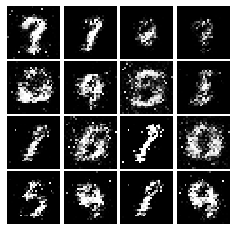

Epoch: 3, Iter: 1680, D: 1.277, G:0.9881


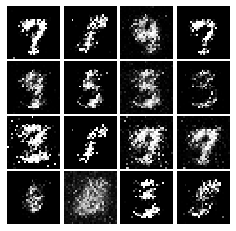

Epoch: 3, Iter: 1700, D: 1.263, G:1.013


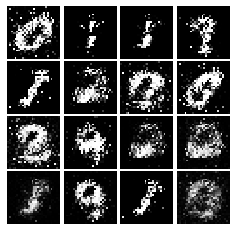

Epoch: 3, Iter: 1720, D: 1.193, G:1.115


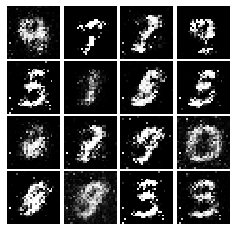

Epoch: 3, Iter: 1740, D: 1.339, G:0.7441


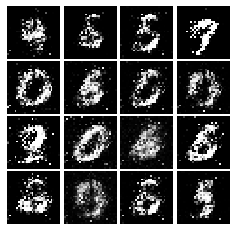

Epoch: 3, Iter: 1760, D: 1.069, G:1.556


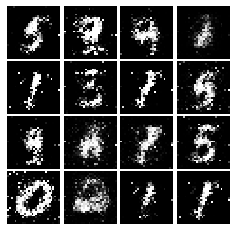

Epoch: 3, Iter: 1780, D: 1.206, G:0.9314


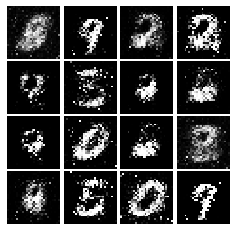

Epoch: 3, Iter: 1800, D: 1.324, G:1.086


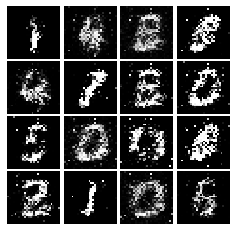

Epoch: 3, Iter: 1820, D: 1.299, G:0.734


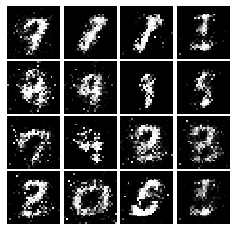

Epoch: 3, Iter: 1840, D: 1.44, G:0.9903


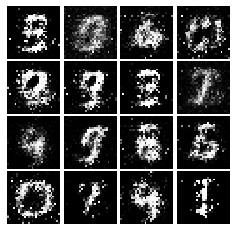

Epoch: 3, Iter: 1860, D: 1.274, G:0.8719


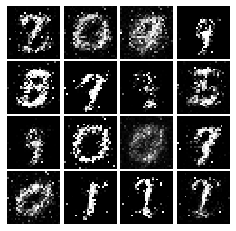

Epoch: 4, Iter: 1880, D: 1.109, G:0.9336


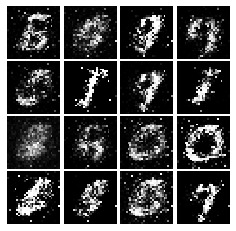

Epoch: 4, Iter: 1900, D: 1.222, G:1.757


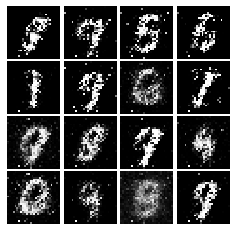

Epoch: 4, Iter: 1920, D: 1.288, G:1.011


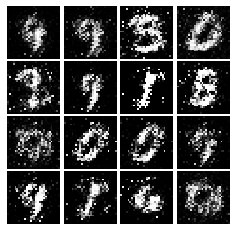

Epoch: 4, Iter: 1940, D: 1.31, G:0.8474


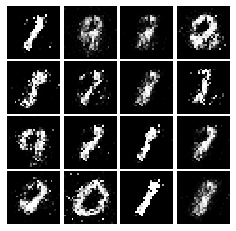

Epoch: 4, Iter: 1960, D: 1.326, G:1.106


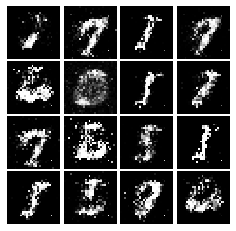

Epoch: 4, Iter: 1980, D: 1.372, G:1.211


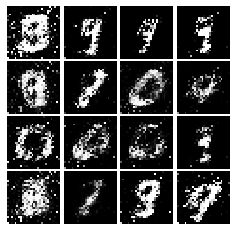

Epoch: 4, Iter: 2000, D: 1.217, G:1.861


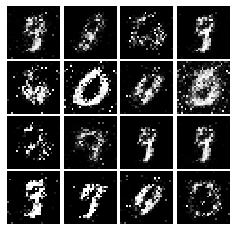

Epoch: 4, Iter: 2020, D: 1.35, G:0.8904


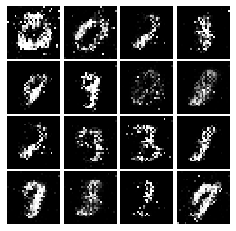

Epoch: 4, Iter: 2040, D: 1.292, G:0.9174


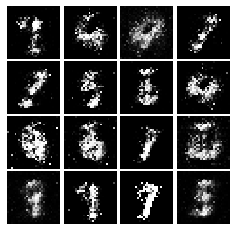

Epoch: 4, Iter: 2060, D: 1.335, G:0.8593


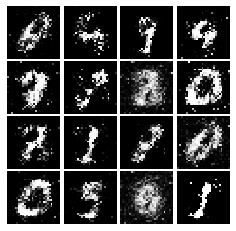

Epoch: 4, Iter: 2080, D: 1.323, G:0.9407


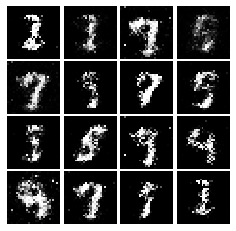

Epoch: 4, Iter: 2100, D: 1.381, G:0.8628


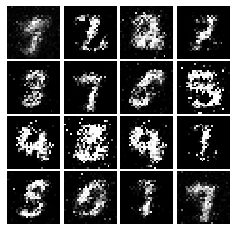

Epoch: 4, Iter: 2120, D: 1.401, G:0.867


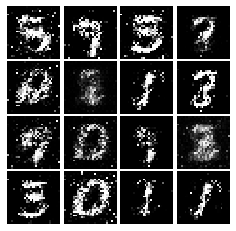

Epoch: 4, Iter: 2140, D: 1.486, G:0.1919


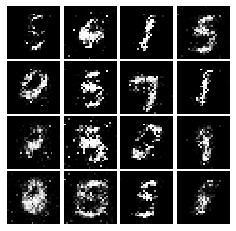

Epoch: 4, Iter: 2160, D: 1.331, G:0.7642


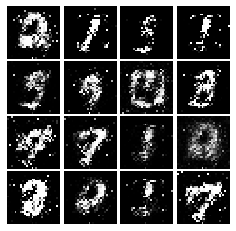

Epoch: 4, Iter: 2180, D: 1.285, G:0.7813


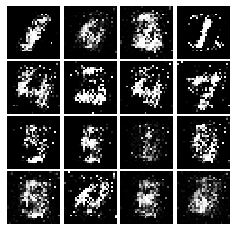

Epoch: 4, Iter: 2200, D: 1.317, G:0.9248


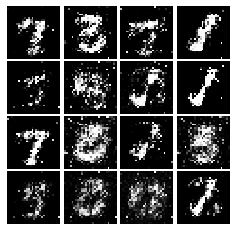

Epoch: 4, Iter: 2220, D: 1.378, G:0.8184


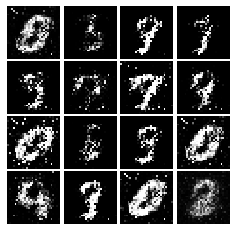

Epoch: 4, Iter: 2240, D: 1.305, G:0.8288


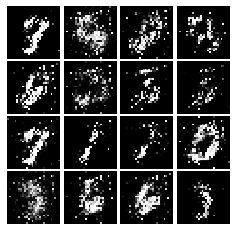

Epoch: 4, Iter: 2260, D: 1.307, G:1.015


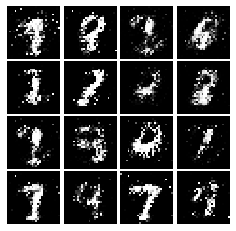

Epoch: 4, Iter: 2280, D: 1.37, G:0.9103


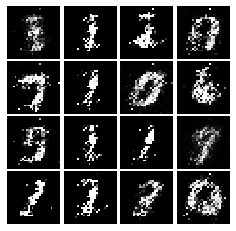

Epoch: 4, Iter: 2300, D: 1.301, G:0.88


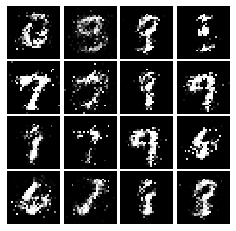

Epoch: 4, Iter: 2320, D: 1.278, G:0.8431


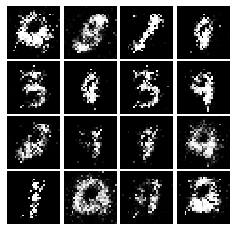

Epoch: 4, Iter: 2340, D: 1.127, G:1.027


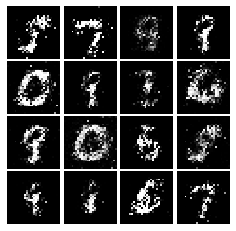

Epoch: 5, Iter: 2360, D: 1.146, G:0.8662


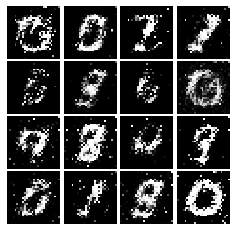

Epoch: 5, Iter: 2380, D: 1.3, G:0.9596


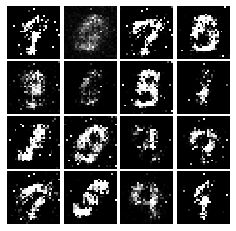

Epoch: 5, Iter: 2400, D: 1.456, G:0.8081


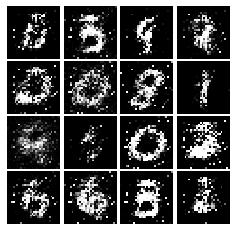

Epoch: 5, Iter: 2420, D: 1.214, G:1.082


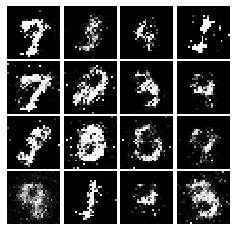

Epoch: 5, Iter: 2440, D: 1.235, G:0.8322


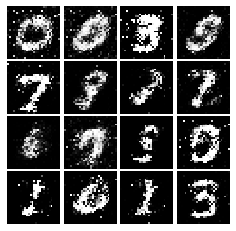

Epoch: 5, Iter: 2460, D: 1.241, G:0.8985


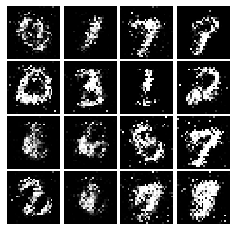

Epoch: 5, Iter: 2480, D: 1.212, G:0.882


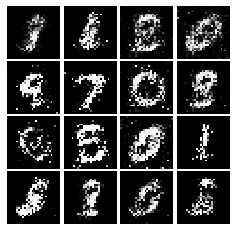

Epoch: 5, Iter: 2500, D: 1.121, G:1.415


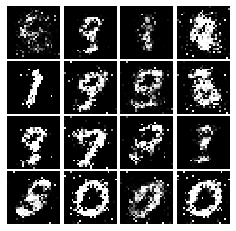

Epoch: 5, Iter: 2520, D: 1.431, G:0.8915


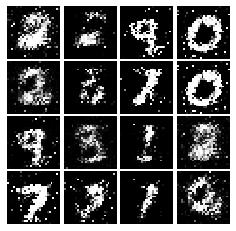

Epoch: 5, Iter: 2540, D: 1.199, G:0.8973


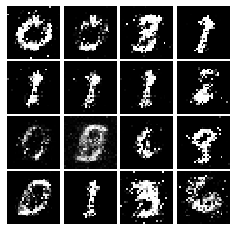

Epoch: 5, Iter: 2560, D: 1.424, G:0.8887


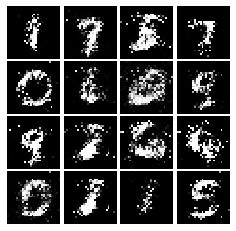

Epoch: 5, Iter: 2580, D: 1.222, G:1.094


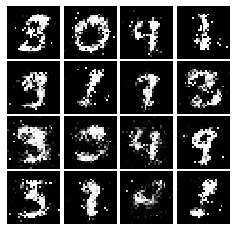

Epoch: 5, Iter: 2600, D: 1.412, G:0.8588


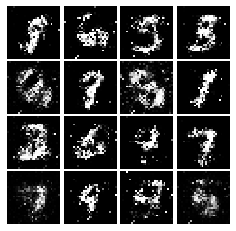

Epoch: 5, Iter: 2620, D: 1.264, G:1.005


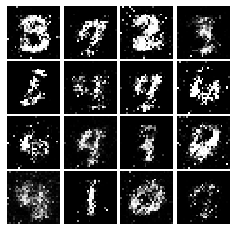

Epoch: 5, Iter: 2640, D: 1.475, G:0.8532


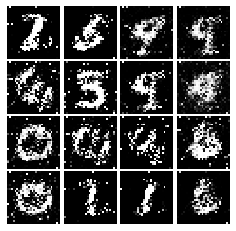

Epoch: 5, Iter: 2660, D: 1.127, G:1.196


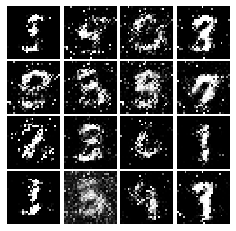

Epoch: 5, Iter: 2680, D: 1.612, G:0.7257


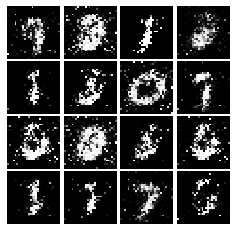

Epoch: 5, Iter: 2700, D: 1.498, G:0.8708


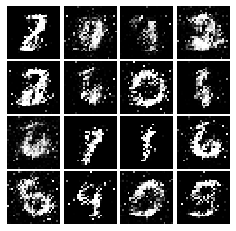

Epoch: 5, Iter: 2720, D: 1.38, G:1.179


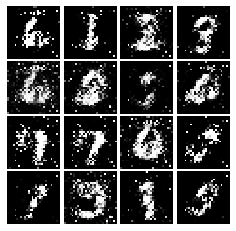

Epoch: 5, Iter: 2740, D: 1.132, G:0.7617


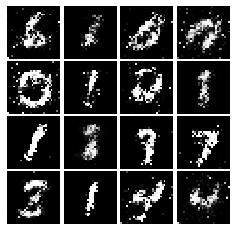

Epoch: 5, Iter: 2760, D: 1.234, G:0.9495


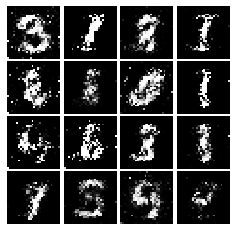

Epoch: 5, Iter: 2780, D: 1.23, G:0.8612


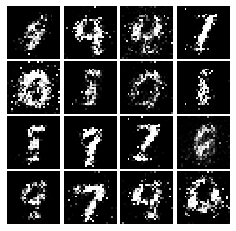

Epoch: 5, Iter: 2800, D: 1.367, G:0.7845


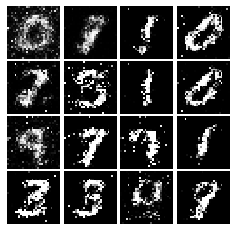

Epoch: 6, Iter: 2820, D: 1.328, G:0.8903


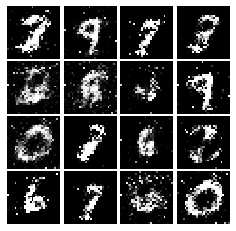

Epoch: 6, Iter: 2840, D: 1.319, G:0.9608


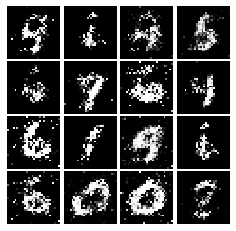

Epoch: 6, Iter: 2860, D: 1.359, G:0.8751


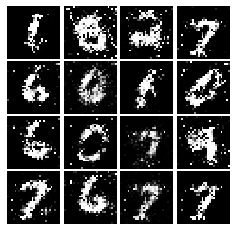

Epoch: 6, Iter: 2880, D: 1.195, G:1.214


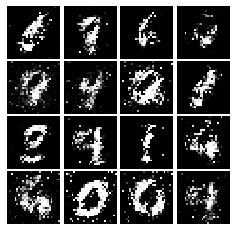

Epoch: 6, Iter: 2900, D: 1.379, G:1.1


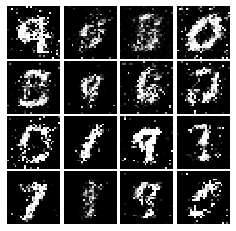

Epoch: 6, Iter: 2920, D: 1.246, G:0.8697


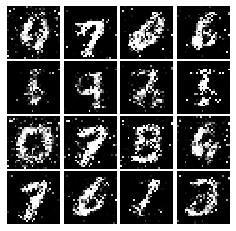

Epoch: 6, Iter: 2940, D: 1.288, G:0.8355


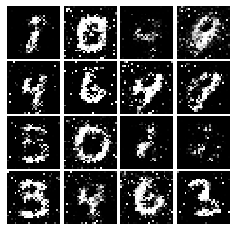

Epoch: 6, Iter: 2960, D: 1.19, G:1.126


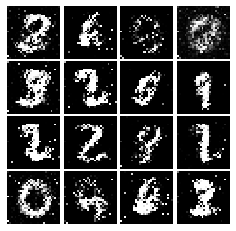

Epoch: 6, Iter: 2980, D: 1.221, G:0.8744


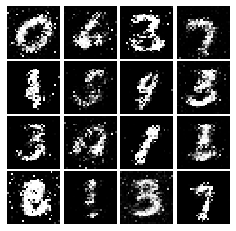

Epoch: 6, Iter: 3000, D: 1.365, G:0.7087


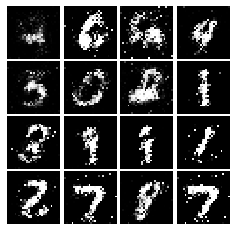

Epoch: 6, Iter: 3020, D: 1.309, G:1.116


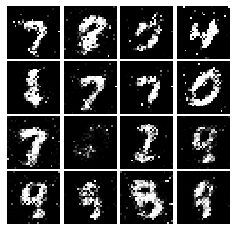

Epoch: 6, Iter: 3040, D: 1.293, G:0.9145


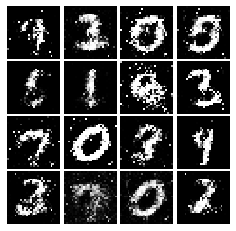

Epoch: 6, Iter: 3060, D: 1.28, G:1.003


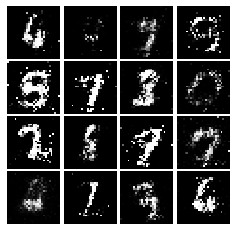

Epoch: 6, Iter: 3080, D: 1.271, G:0.8755


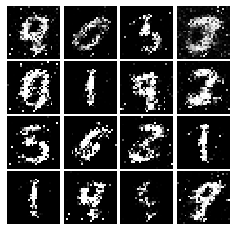

Epoch: 6, Iter: 3100, D: 1.25, G:0.7533


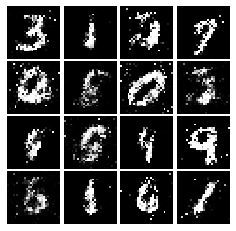

Epoch: 6, Iter: 3120, D: 1.31, G:0.8598


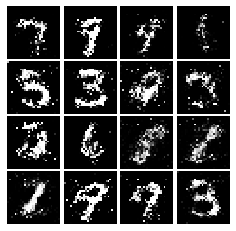

Epoch: 6, Iter: 3140, D: 1.419, G:0.7759


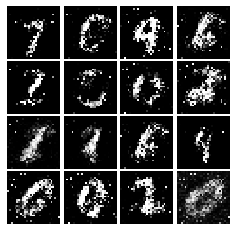

Epoch: 6, Iter: 3160, D: 1.335, G:0.7607


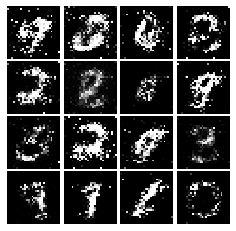

Epoch: 6, Iter: 3180, D: 1.251, G:0.8137


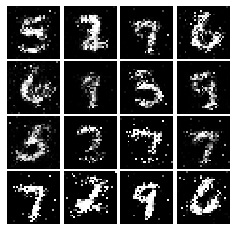

Epoch: 6, Iter: 3200, D: 1.335, G:0.9024


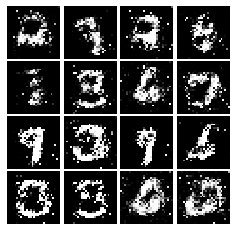

Epoch: 6, Iter: 3220, D: 1.354, G:0.757


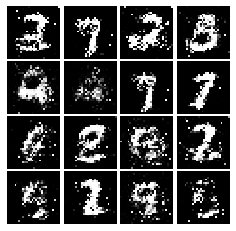

Epoch: 6, Iter: 3240, D: 1.273, G:0.8302


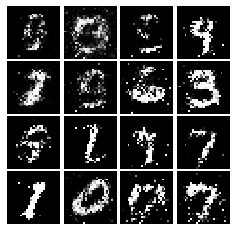

Epoch: 6, Iter: 3260, D: 1.387, G:1.039


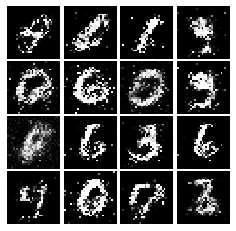

Epoch: 6, Iter: 3280, D: 1.399, G:0.8217


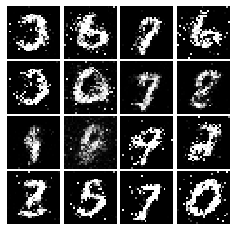

Epoch: 7, Iter: 3300, D: 1.283, G:0.7114


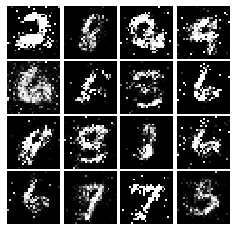

Epoch: 7, Iter: 3320, D: 1.161, G:0.7963


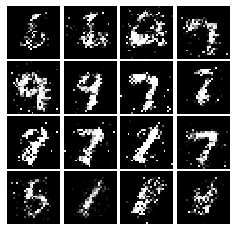

Epoch: 7, Iter: 3340, D: 1.326, G:0.7493


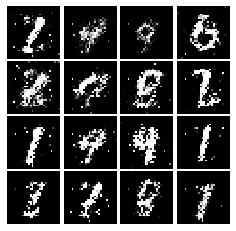

Epoch: 7, Iter: 3360, D: 1.329, G:0.8701


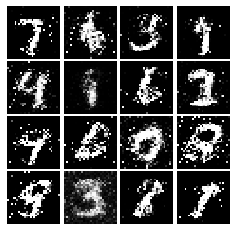

Epoch: 7, Iter: 3380, D: 1.325, G:0.8724


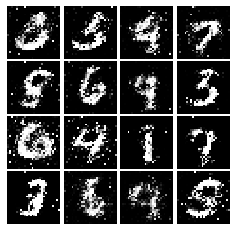

Epoch: 7, Iter: 3400, D: 1.459, G:0.8848


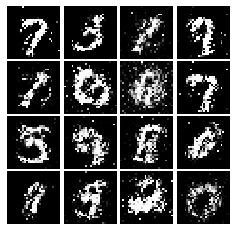

Epoch: 7, Iter: 3420, D: 1.366, G:0.917


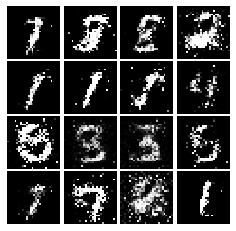

Epoch: 7, Iter: 3440, D: 1.282, G:0.8122


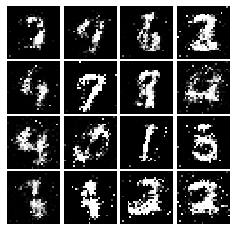

Epoch: 7, Iter: 3460, D: 1.326, G:0.7722


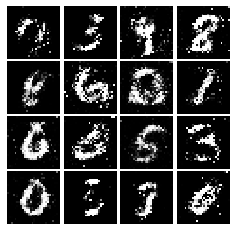

Epoch: 7, Iter: 3480, D: 1.422, G:0.7777


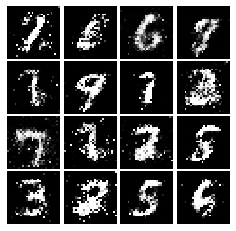

Epoch: 7, Iter: 3500, D: 1.272, G:0.8689


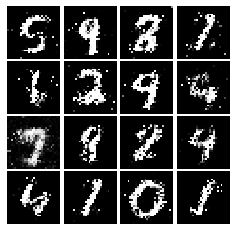

Epoch: 7, Iter: 3520, D: 1.326, G:0.8328


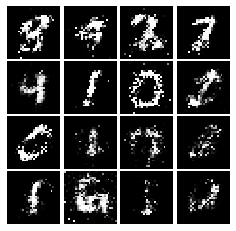

Epoch: 7, Iter: 3540, D: 1.195, G:0.87


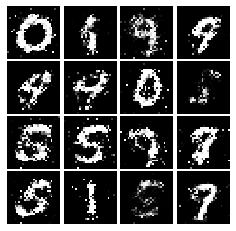

Epoch: 7, Iter: 3560, D: 1.215, G:0.8381


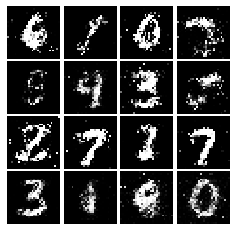

Epoch: 7, Iter: 3580, D: 1.397, G:0.798


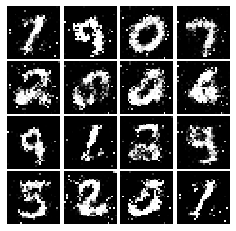

Epoch: 7, Iter: 3600, D: 1.247, G:0.8132


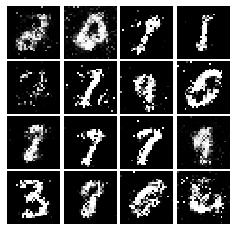

Epoch: 7, Iter: 3620, D: 1.359, G:0.8244


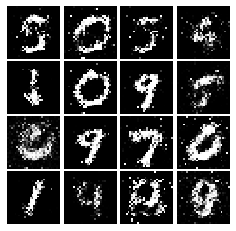

Epoch: 7, Iter: 3640, D: 1.376, G:0.8111


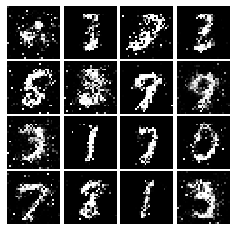

Epoch: 7, Iter: 3660, D: 1.319, G:0.7839


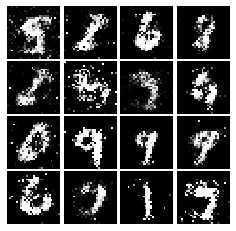

Epoch: 7, Iter: 3680, D: 1.338, G:0.8451


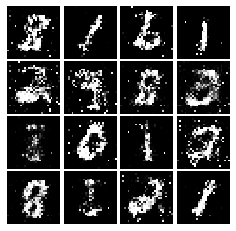

Epoch: 7, Iter: 3700, D: 1.29, G:0.8391


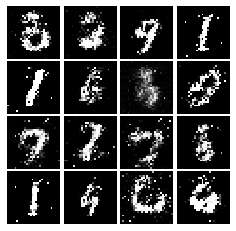

Epoch: 7, Iter: 3720, D: 1.344, G:0.8231


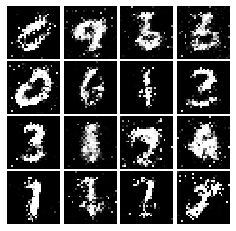

Epoch: 7, Iter: 3740, D: 1.348, G:0.6976


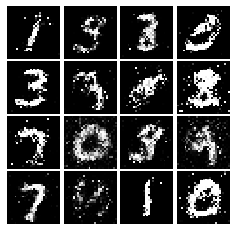

Epoch: 8, Iter: 3760, D: 1.375, G:0.7484


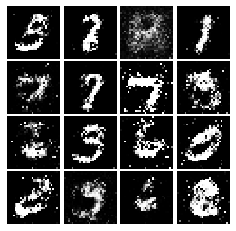

Epoch: 8, Iter: 3780, D: 1.351, G:0.8508


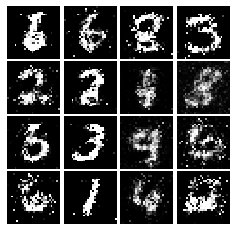

Epoch: 8, Iter: 3800, D: 1.333, G:0.8155


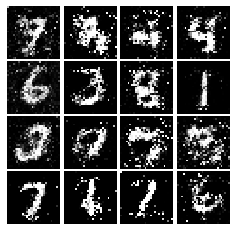

Epoch: 8, Iter: 3820, D: 1.207, G:0.826


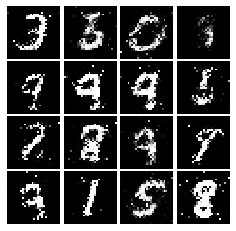

Epoch: 8, Iter: 3840, D: 1.334, G:0.795


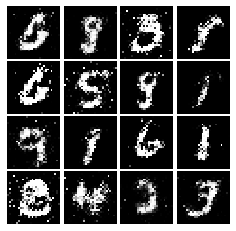

Epoch: 8, Iter: 3860, D: 1.303, G:0.6523


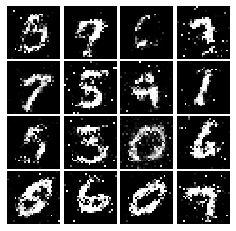

Epoch: 8, Iter: 3880, D: 1.334, G:0.7253


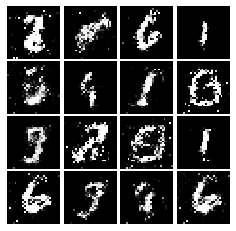

Epoch: 8, Iter: 3900, D: 1.316, G:0.7166


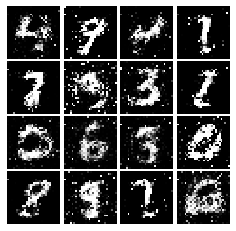

Epoch: 8, Iter: 3920, D: 1.293, G:0.8011


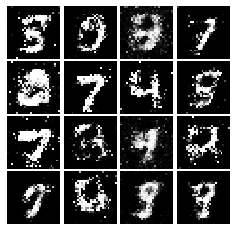

Epoch: 8, Iter: 3940, D: 1.388, G:0.7927


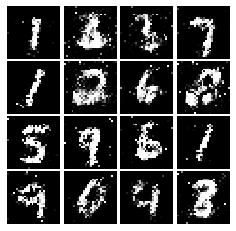

Epoch: 8, Iter: 3960, D: 1.361, G:0.8115


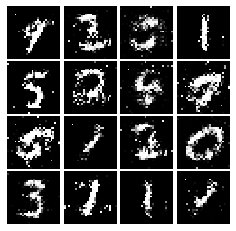

Epoch: 8, Iter: 3980, D: 1.321, G:0.7725


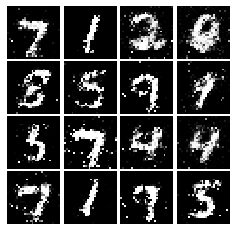

Epoch: 8, Iter: 4000, D: 1.254, G:0.8149


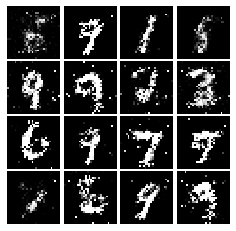

Epoch: 8, Iter: 4020, D: 1.336, G:0.681


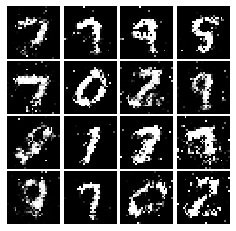

Epoch: 8, Iter: 4040, D: 1.284, G:0.9122


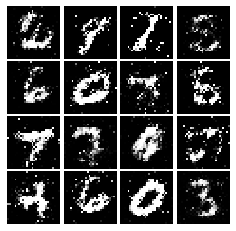

Epoch: 8, Iter: 4060, D: 1.338, G:0.7478


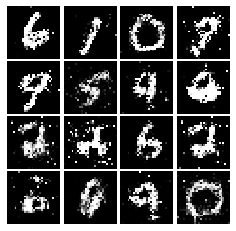

Epoch: 8, Iter: 4080, D: 1.411, G:0.7395


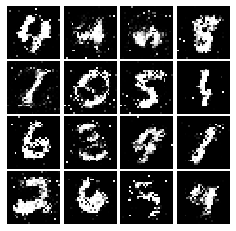

Epoch: 8, Iter: 4100, D: 1.354, G:0.7125


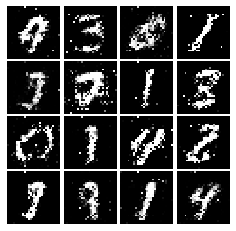

Epoch: 8, Iter: 4120, D: 1.288, G:0.8256


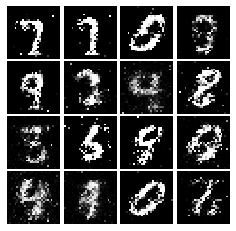

Epoch: 8, Iter: 4140, D: 1.341, G:0.8091


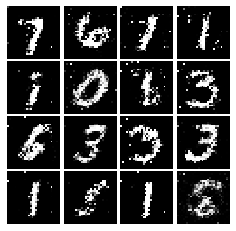

Epoch: 8, Iter: 4160, D: 1.375, G:0.8116


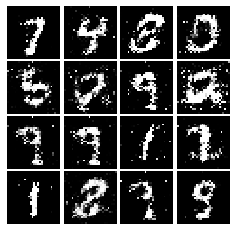

Epoch: 8, Iter: 4180, D: 1.428, G:0.7878


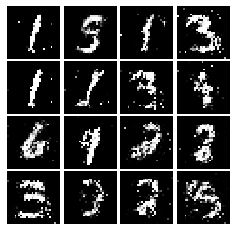

Epoch: 8, Iter: 4200, D: 1.42, G:0.7943


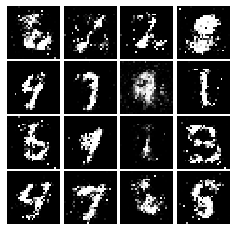

Epoch: 8, Iter: 4220, D: 1.312, G:0.8117


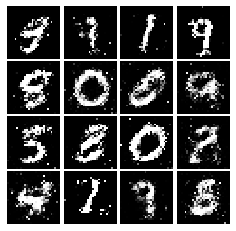

Epoch: 9, Iter: 4240, D: 1.426, G:0.8342


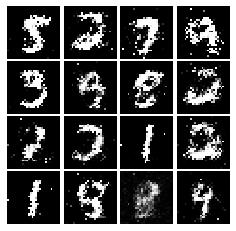

Epoch: 9, Iter: 4260, D: 1.413, G:0.8053


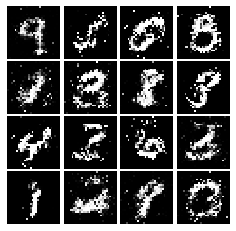

Epoch: 9, Iter: 4280, D: 1.487, G:0.7386


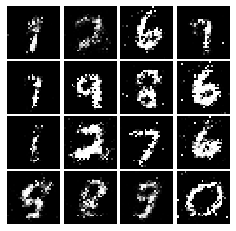

Epoch: 9, Iter: 4300, D: 1.309, G:0.8165


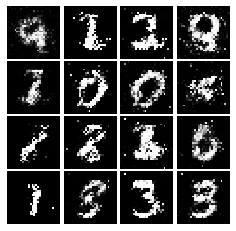

Epoch: 9, Iter: 4320, D: 1.366, G:0.7658


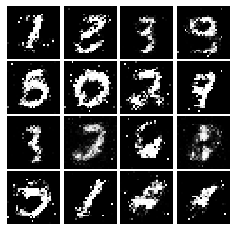

Epoch: 9, Iter: 4340, D: 1.357, G:0.932


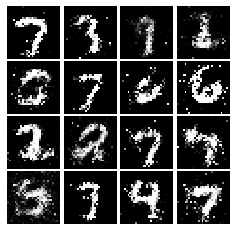

Epoch: 9, Iter: 4360, D: 1.353, G:0.7343


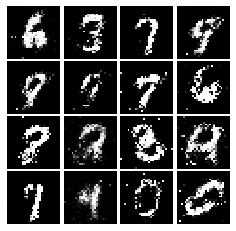

Epoch: 9, Iter: 4380, D: 1.361, G:0.8231


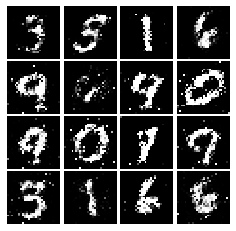

Epoch: 9, Iter: 4400, D: 1.234, G:1.021


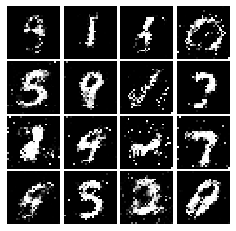

Epoch: 9, Iter: 4420, D: 1.26, G:0.8853


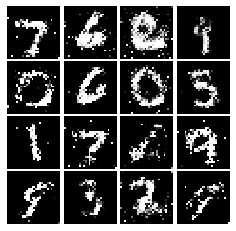

Epoch: 9, Iter: 4440, D: 1.315, G:0.7262


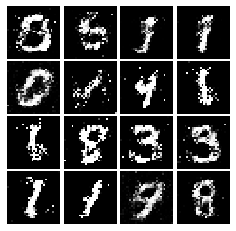

Epoch: 9, Iter: 4460, D: 1.314, G:0.8623


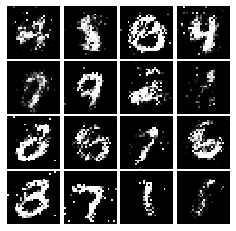

Epoch: 9, Iter: 4480, D: 1.335, G:0.7927


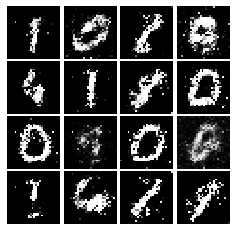

Epoch: 9, Iter: 4500, D: 1.47, G:0.7512


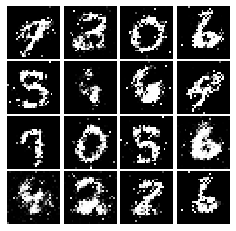

Epoch: 9, Iter: 4520, D: 1.316, G:0.7586


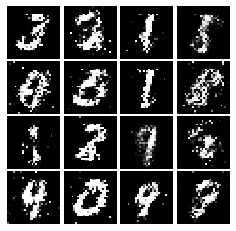

Epoch: 9, Iter: 4540, D: 1.392, G:0.7517


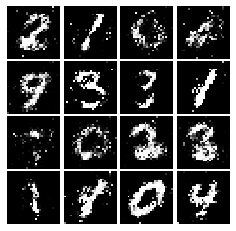

Epoch: 9, Iter: 4560, D: 1.343, G:0.6911


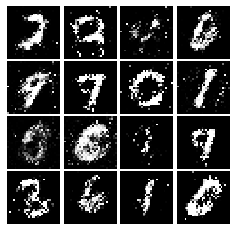

Epoch: 9, Iter: 4580, D: 1.283, G:0.872


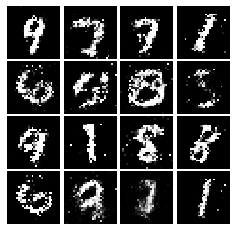

Epoch: 9, Iter: 4600, D: 1.353, G:0.8565


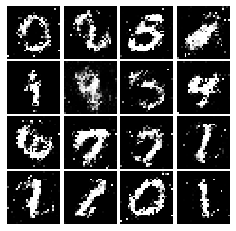

Epoch: 9, Iter: 4620, D: 1.393, G:0.7236


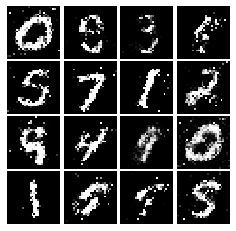

Epoch: 9, Iter: 4640, D: 1.347, G:0.7927


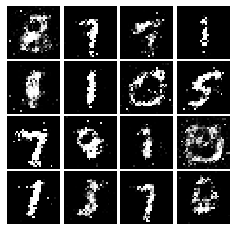

Epoch: 9, Iter: 4660, D: 1.352, G:0.8124


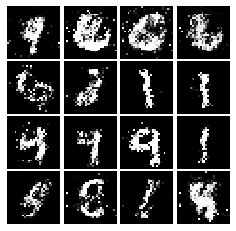

Epoch: 9, Iter: 4680, D: 1.374, G:0.7767


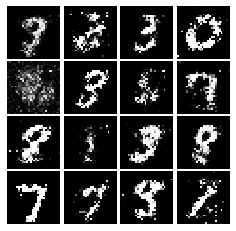

Final images


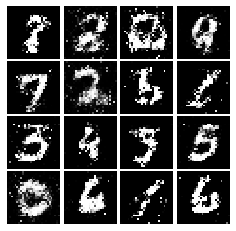

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [19]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.math.reduce_mean(tf.pow(scores_real - 1, 2)) + 0.5 * tf.math.reduce_mean(tf.pow(scores_fake, 2)) 

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.math.reduce_mean(tf.pow(scores_fake - 1, 2))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [20]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1427, G:0.6038


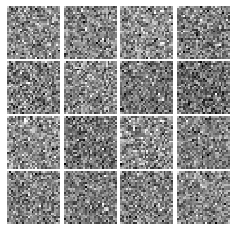

Epoch: 0, Iter: 20, D: 0.1177, G:0.7828


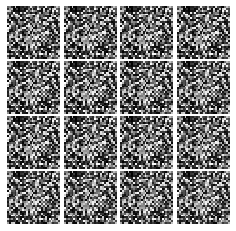

Epoch: 0, Iter: 40, D: 0.05056, G:0.7296


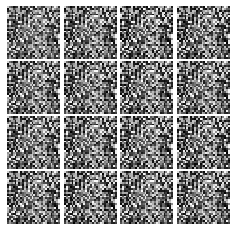

Epoch: 0, Iter: 60, D: 0.05506, G:0.873


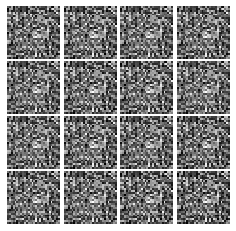

Epoch: 0, Iter: 80, D: 0.04668, G:0.6884


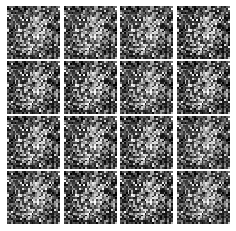

Epoch: 0, Iter: 100, D: 0.06984, G:0.9055


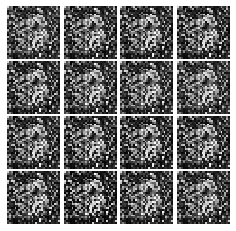

Epoch: 0, Iter: 120, D: 0.02038, G:0.6255


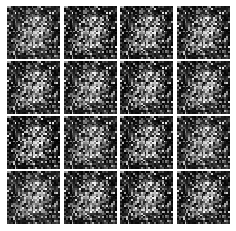

Epoch: 0, Iter: 140, D: 0.215, G:1.671


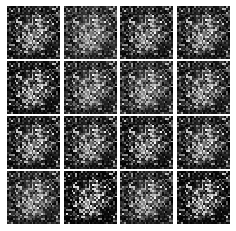

Epoch: 0, Iter: 160, D: 0.1288, G:0.1539


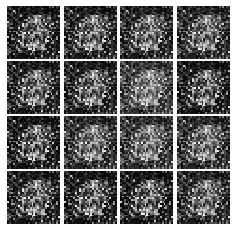

Epoch: 0, Iter: 180, D: 0.1172, G:0.2796


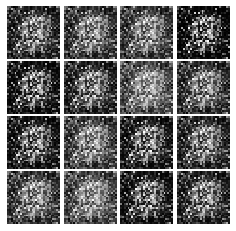

Epoch: 0, Iter: 200, D: 0.4607, G:0.3245


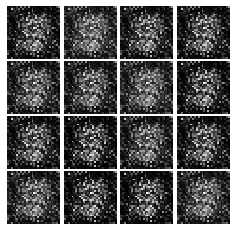

Epoch: 0, Iter: 220, D: 0.1849, G:0.3987


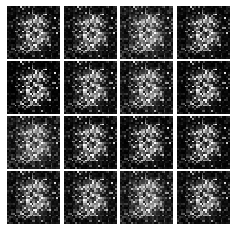

Epoch: 0, Iter: 240, D: 0.144, G:0.7679


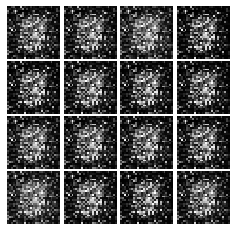

Epoch: 0, Iter: 260, D: 0.138, G:0.1738


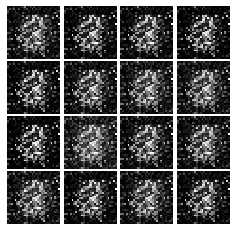

Epoch: 0, Iter: 280, D: 0.05296, G:0.4484


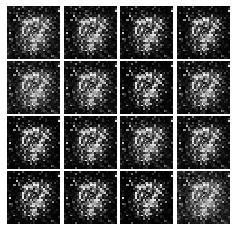

Epoch: 0, Iter: 300, D: 0.1404, G:0.2741


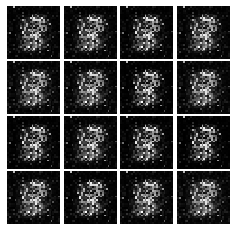

Epoch: 0, Iter: 320, D: 0.1989, G:0.8217


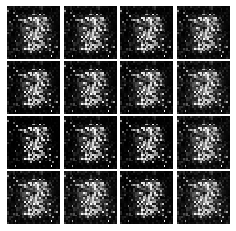

Epoch: 0, Iter: 340, D: 0.1205, G:0.3328


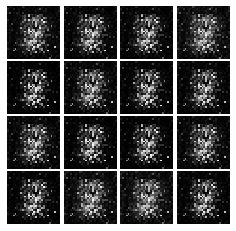

Epoch: 0, Iter: 360, D: 0.08288, G:0.4807


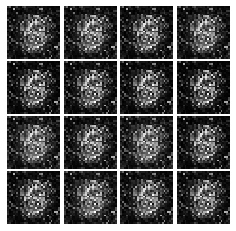

Epoch: 0, Iter: 380, D: 0.04185, G:0.5965


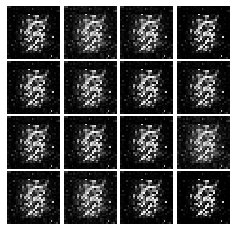

Epoch: 0, Iter: 400, D: 0.07631, G:0.5272


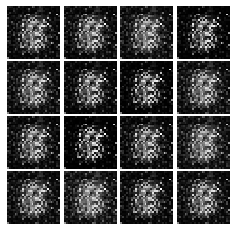

Epoch: 0, Iter: 420, D: 0.04477, G:0.6547


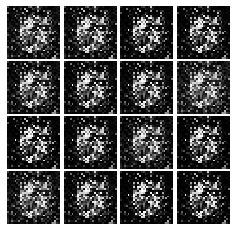

Epoch: 0, Iter: 440, D: 0.1277, G:0.698


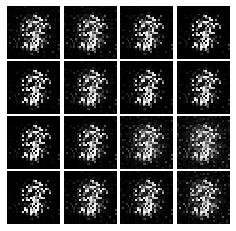

Epoch: 0, Iter: 460, D: 0.1016, G:0.35


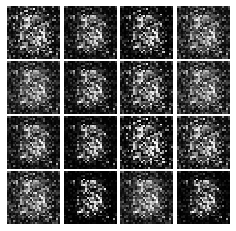

Epoch: 1, Iter: 480, D: 0.1799, G:0.3757


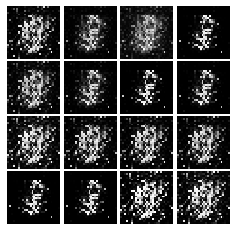

Epoch: 1, Iter: 500, D: 0.09686, G:0.4386


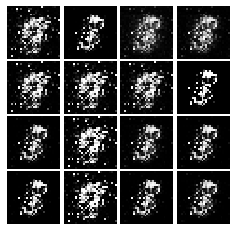

Epoch: 1, Iter: 520, D: 0.1382, G:0.4975


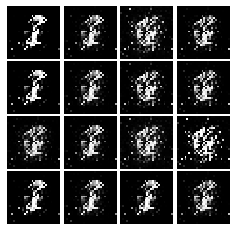

Epoch: 1, Iter: 540, D: 0.7694, G:0.2232


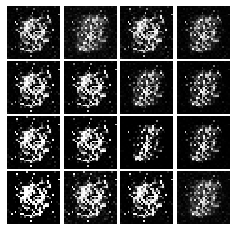

Epoch: 1, Iter: 560, D: 0.2362, G:0.6212


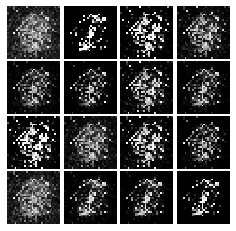

Epoch: 1, Iter: 580, D: 0.08149, G:0.518


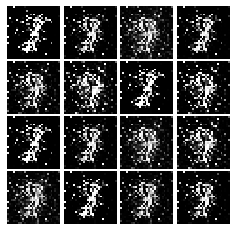

Epoch: 1, Iter: 600, D: 0.1671, G:0.5316


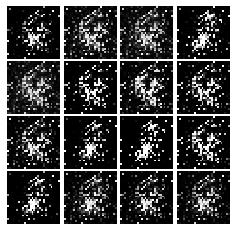

Epoch: 1, Iter: 620, D: 0.3772, G:0.1273


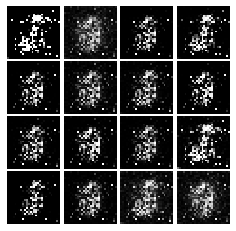

Epoch: 1, Iter: 640, D: 0.06275, G:0.4512


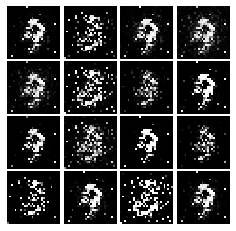

Epoch: 1, Iter: 660, D: 0.1807, G:0.312


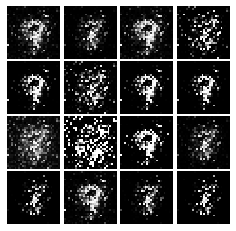

Epoch: 1, Iter: 680, D: 0.1965, G:0.3514


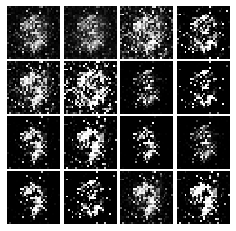

Epoch: 1, Iter: 700, D: 0.1219, G:0.6428


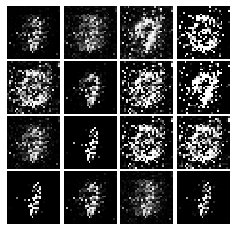

Epoch: 1, Iter: 720, D: 0.117, G:0.388


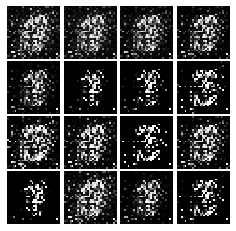

Epoch: 1, Iter: 740, D: 0.2102, G:0.3352


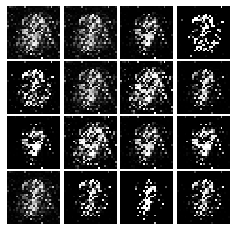

Epoch: 1, Iter: 760, D: 0.114, G:0.3413


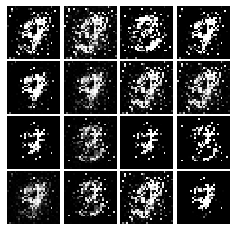

Epoch: 1, Iter: 780, D: 0.1357, G:0.3112


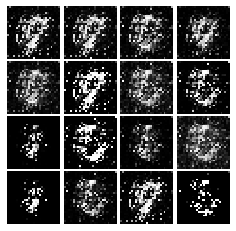

Epoch: 1, Iter: 800, D: 0.1236, G:0.5493


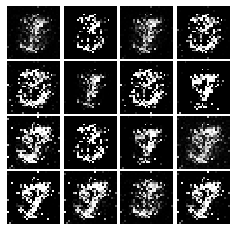

Epoch: 1, Iter: 820, D: 0.1503, G:0.2304


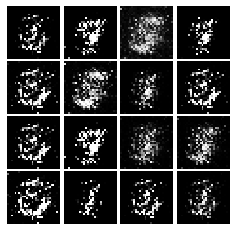

Epoch: 1, Iter: 840, D: 0.1277, G:0.4212


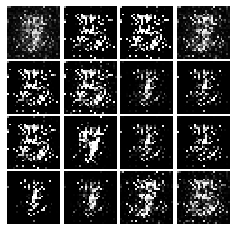

Epoch: 1, Iter: 860, D: 0.1105, G:0.3476


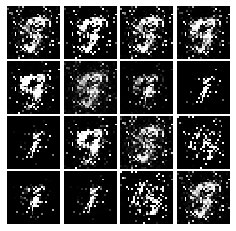

Epoch: 1, Iter: 880, D: 0.1427, G:0.2737


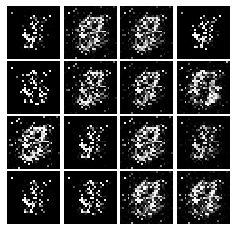

Epoch: 1, Iter: 900, D: 0.1201, G:0.3782


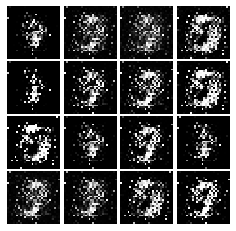

Epoch: 1, Iter: 920, D: 0.1496, G:0.3789


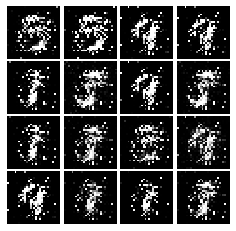

Epoch: 2, Iter: 940, D: 1.28, G:0.8524


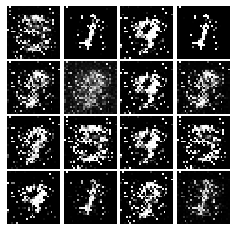

Epoch: 2, Iter: 960, D: 0.1961, G:0.3292


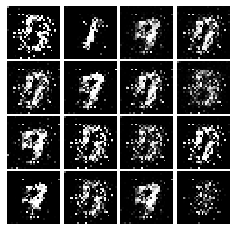

Epoch: 2, Iter: 980, D: 0.1281, G:0.4336


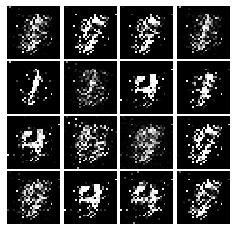

Epoch: 2, Iter: 1000, D: 0.1084, G:0.514


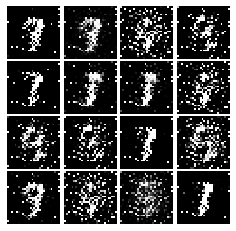

Epoch: 2, Iter: 1020, D: 0.1332, G:0.3886


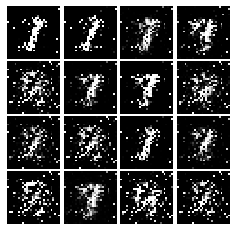

Epoch: 2, Iter: 1040, D: 0.1069, G:0.4089


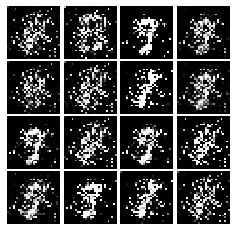

Epoch: 2, Iter: 1060, D: 0.1405, G:0.4188


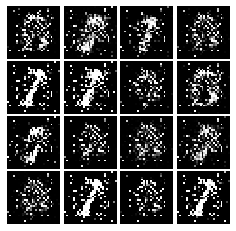

Epoch: 2, Iter: 1080, D: 0.1534, G:0.331


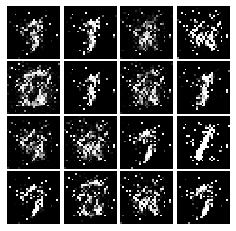

Epoch: 2, Iter: 1100, D: 0.1031, G:0.4023


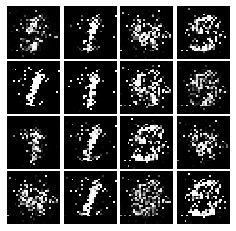

Epoch: 2, Iter: 1120, D: 0.1485, G:0.2657


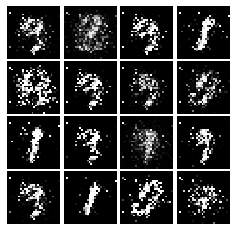

Epoch: 2, Iter: 1140, D: 0.1748, G:0.3268


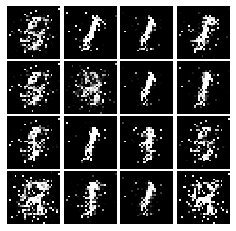

Epoch: 2, Iter: 1160, D: 0.1959, G:0.4829


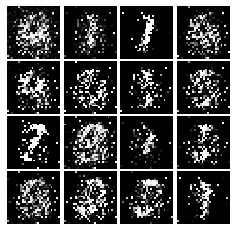

Epoch: 2, Iter: 1180, D: 0.1478, G:0.9625


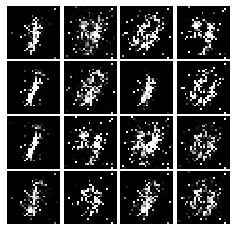

Epoch: 2, Iter: 1200, D: 0.1799, G:0.3048


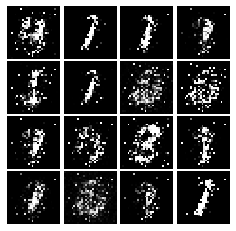

Epoch: 2, Iter: 1220, D: 0.1688, G:0.3934


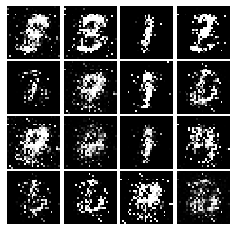

Epoch: 2, Iter: 1240, D: 0.1343, G:0.6138


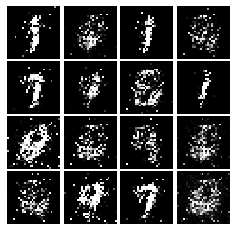

Epoch: 2, Iter: 1260, D: 0.1803, G:0.2244


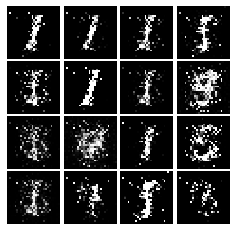

Epoch: 2, Iter: 1280, D: 0.1828, G:0.2695


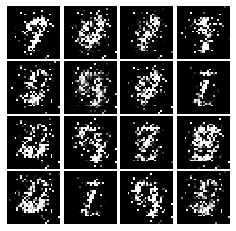

Epoch: 2, Iter: 1300, D: 0.3305, G:0.1063


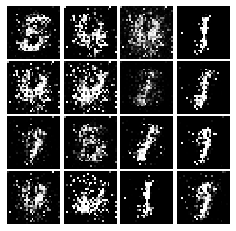

Epoch: 2, Iter: 1320, D: 0.2208, G:0.2533


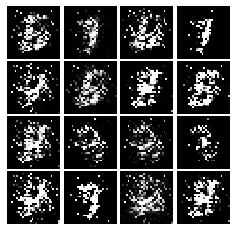

Epoch: 2, Iter: 1340, D: 0.1535, G:0.3609


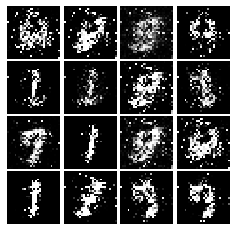

Epoch: 2, Iter: 1360, D: 0.1785, G:0.2705


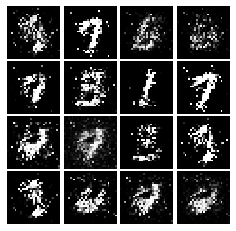

Epoch: 2, Iter: 1380, D: 0.1763, G:0.3192


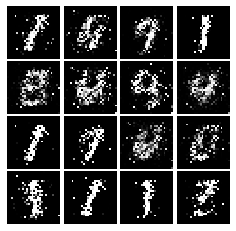

Epoch: 2, Iter: 1400, D: 0.1468, G:0.3214


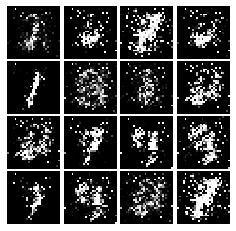

Epoch: 3, Iter: 1420, D: 0.186, G:0.2621


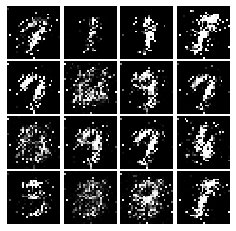

Epoch: 3, Iter: 1440, D: 0.1493, G:0.3039


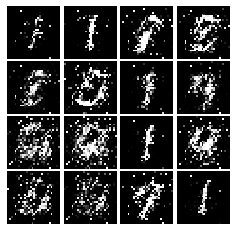

Epoch: 3, Iter: 1460, D: 0.1806, G:0.3821


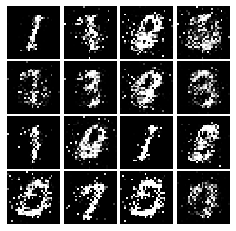

Epoch: 3, Iter: 1480, D: 0.1717, G:0.2999


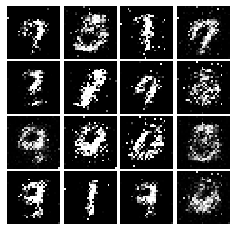

Epoch: 3, Iter: 1500, D: 0.1835, G:0.2745


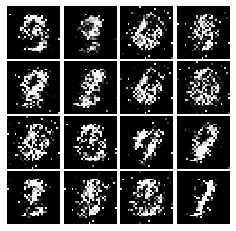

Epoch: 3, Iter: 1520, D: 0.2055, G:0.2716


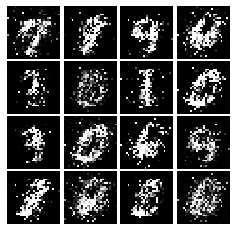

Epoch: 3, Iter: 1540, D: 0.186, G:0.258


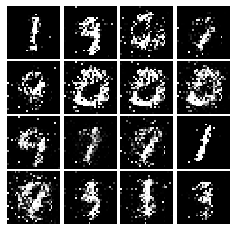

Epoch: 3, Iter: 1560, D: 0.227, G:0.5008


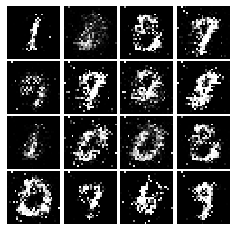

Epoch: 3, Iter: 1580, D: 0.2051, G:0.2621


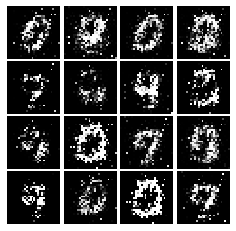

Epoch: 3, Iter: 1600, D: 0.1879, G:0.2401


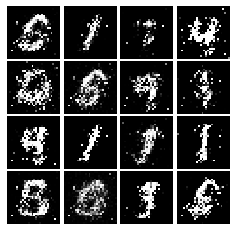

Epoch: 3, Iter: 1620, D: 0.1847, G:0.3288


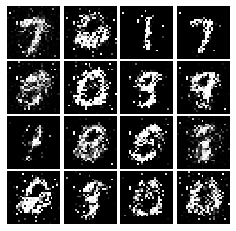

Epoch: 3, Iter: 1640, D: 0.1697, G:0.3254


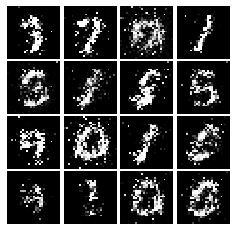

Epoch: 3, Iter: 1660, D: 0.1845, G:0.2739


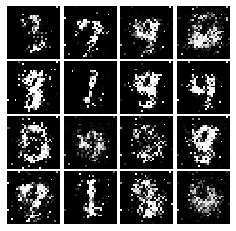

Epoch: 3, Iter: 1680, D: 0.1764, G:0.2425


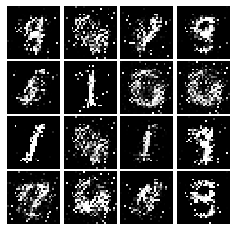

Epoch: 3, Iter: 1700, D: 0.2898, G:0.1985


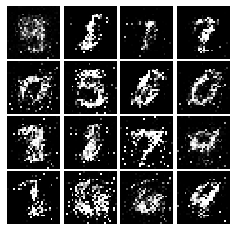

Epoch: 3, Iter: 1720, D: 0.4378, G:0.244


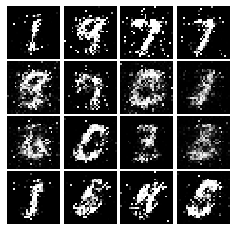

Epoch: 3, Iter: 1740, D: 0.2279, G:0.2361


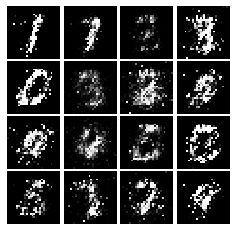

Epoch: 3, Iter: 1760, D: 0.1769, G:0.2779


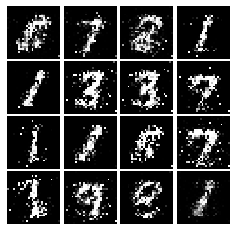

Epoch: 3, Iter: 1780, D: 0.2062, G:0.2023


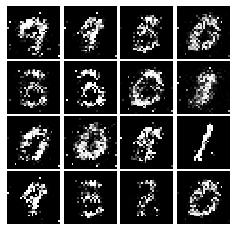

Epoch: 3, Iter: 1800, D: 0.2426, G:0.1997


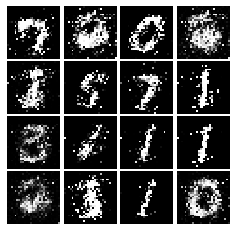

Epoch: 3, Iter: 1820, D: 0.2138, G:0.203


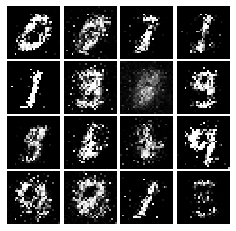

Epoch: 3, Iter: 1840, D: 0.2254, G:0.2036


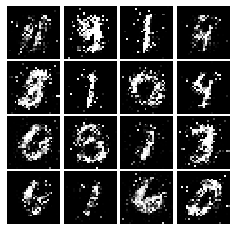

Epoch: 3, Iter: 1860, D: 0.2348, G:0.2163


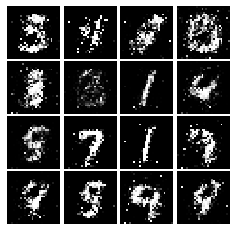

Epoch: 4, Iter: 1880, D: 0.2285, G:0.1757


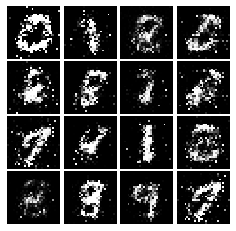

Epoch: 4, Iter: 1900, D: 0.2163, G:0.2009


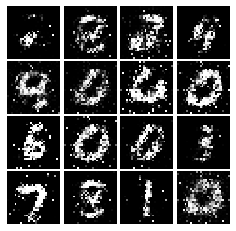

Epoch: 4, Iter: 1920, D: 0.2074, G:0.2343


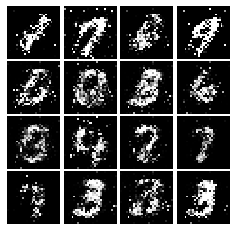

Epoch: 4, Iter: 1940, D: 0.1873, G:0.2172


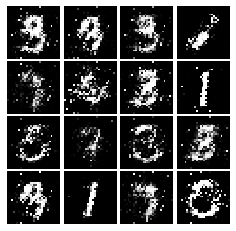

Epoch: 4, Iter: 1960, D: 0.2131, G:0.1766


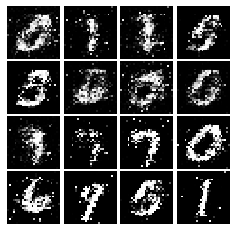

Epoch: 4, Iter: 1980, D: 0.2081, G:0.2336


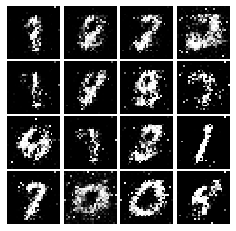

Epoch: 4, Iter: 2000, D: 0.207, G:0.2114


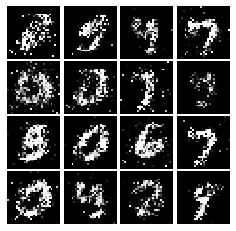

Epoch: 4, Iter: 2020, D: 0.2146, G:0.181


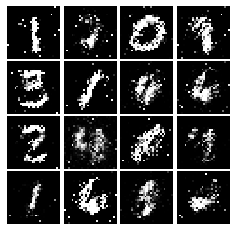

Epoch: 4, Iter: 2040, D: 0.2313, G:0.1793


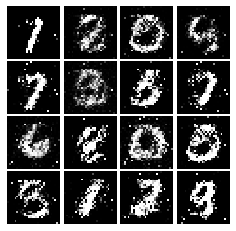

Epoch: 4, Iter: 2060, D: 0.2575, G:0.1778


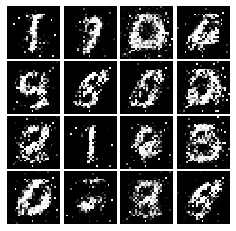

Epoch: 4, Iter: 2080, D: 0.2243, G:0.1846


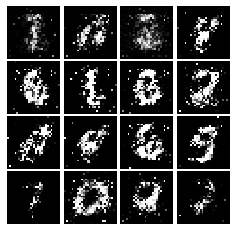

Epoch: 4, Iter: 2100, D: 0.2195, G:0.1724


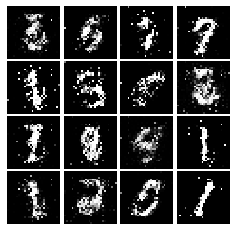

Epoch: 4, Iter: 2120, D: 0.2382, G:0.1737


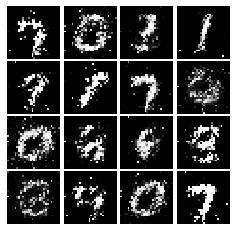

Epoch: 4, Iter: 2140, D: 0.2215, G:0.1473


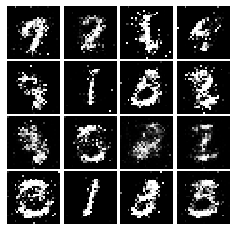

Epoch: 4, Iter: 2160, D: 0.2655, G:0.1915


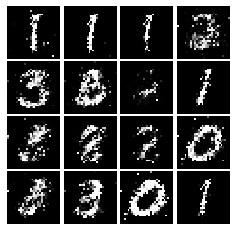

Epoch: 4, Iter: 2180, D: 0.2172, G:0.1619


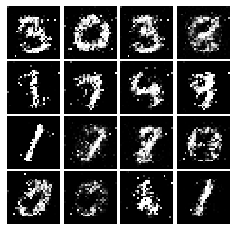

Epoch: 4, Iter: 2200, D: 0.1853, G:0.2468


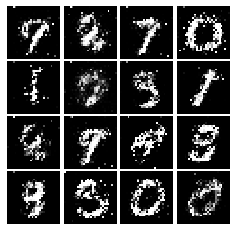

Epoch: 4, Iter: 2220, D: 0.2082, G:0.2077


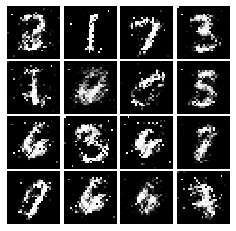

Epoch: 4, Iter: 2240, D: 0.1931, G:0.2069


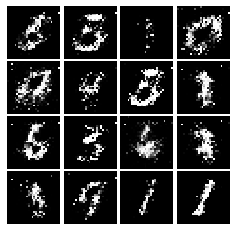

Epoch: 4, Iter: 2260, D: 0.2091, G:0.1356


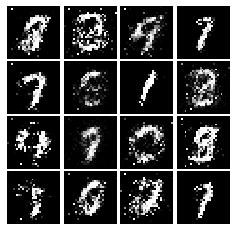

Epoch: 4, Iter: 2280, D: 0.2032, G:0.2124


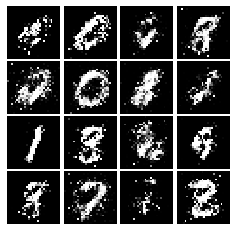

Epoch: 4, Iter: 2300, D: 0.1985, G:0.1953


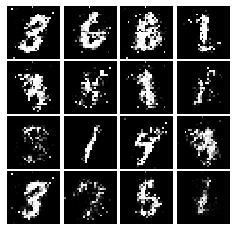

Epoch: 4, Iter: 2320, D: 0.2097, G:0.2086


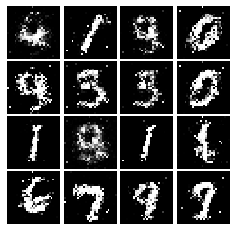

Epoch: 4, Iter: 2340, D: 0.3494, G:0.2073


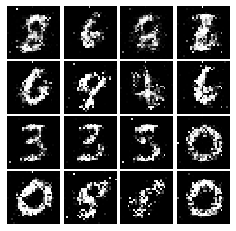

Epoch: 5, Iter: 2360, D: 0.2214, G:0.1752


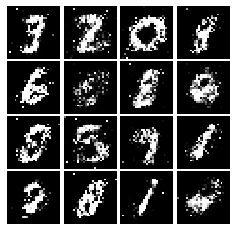

Epoch: 5, Iter: 2380, D: 0.2327, G:0.1611


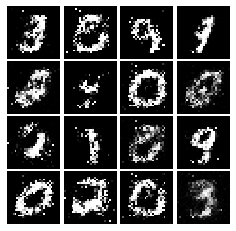

Epoch: 5, Iter: 2400, D: 0.1974, G:0.2255


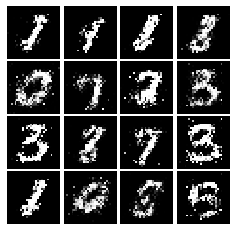

Epoch: 5, Iter: 2420, D: 0.198, G:0.2078


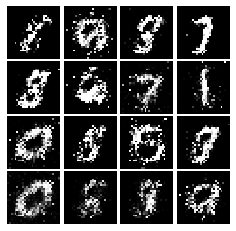

Epoch: 5, Iter: 2440, D: 0.2027, G:0.2074


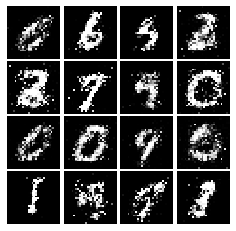

Epoch: 5, Iter: 2460, D: 0.1975, G:0.2222


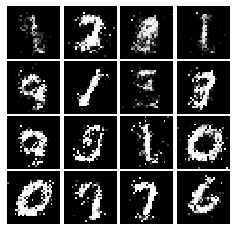

Epoch: 5, Iter: 2480, D: 0.2272, G:0.1937


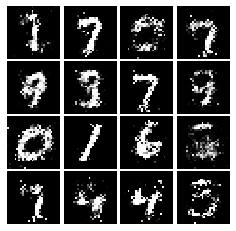

Epoch: 5, Iter: 2500, D: 0.2089, G:0.1585


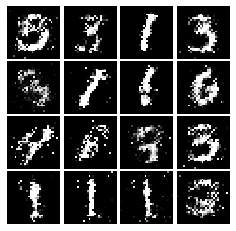

Epoch: 5, Iter: 2520, D: 0.2707, G:0.211


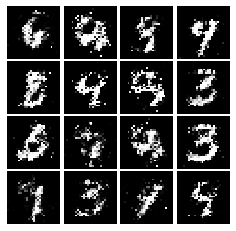

Epoch: 5, Iter: 2540, D: 0.2228, G:0.2102


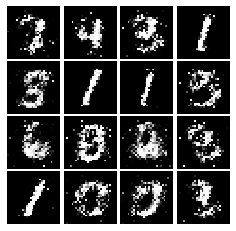

Epoch: 5, Iter: 2560, D: 0.2319, G:0.193


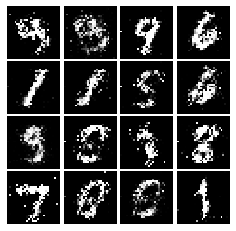

Epoch: 5, Iter: 2580, D: 0.232, G:0.1567


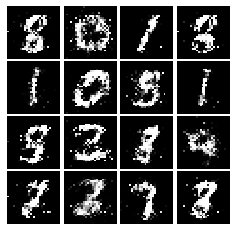

Epoch: 5, Iter: 2600, D: 0.267, G:0.1456


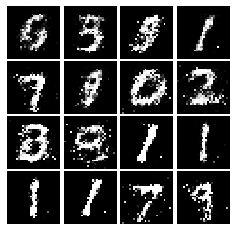

Epoch: 5, Iter: 2620, D: 0.255, G:0.2633


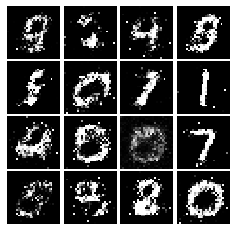

Epoch: 5, Iter: 2640, D: 0.2641, G:0.1722


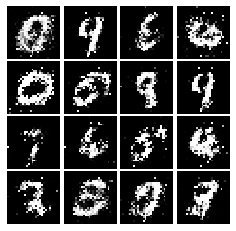

Epoch: 5, Iter: 2660, D: 0.222, G:0.1985


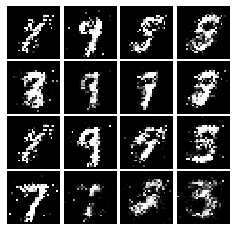

Epoch: 5, Iter: 2680, D: 0.2423, G:0.158


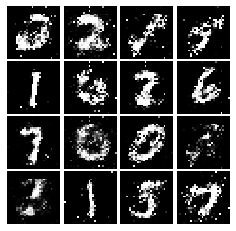

Epoch: 5, Iter: 2700, D: 0.2486, G:0.2118


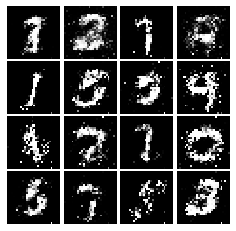

Epoch: 5, Iter: 2720, D: 0.2172, G:0.1858


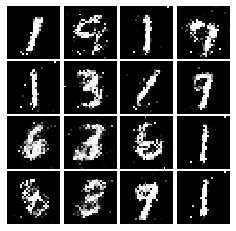

Epoch: 5, Iter: 2740, D: 0.2314, G:0.1897


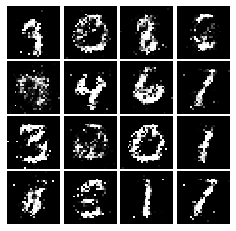

Epoch: 5, Iter: 2760, D: 0.2381, G:0.1687


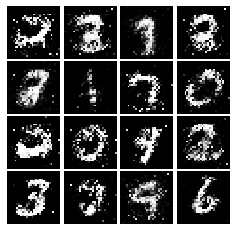

Epoch: 5, Iter: 2780, D: 0.2139, G:0.1438


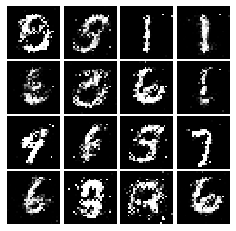

Epoch: 5, Iter: 2800, D: 0.1995, G:0.1489


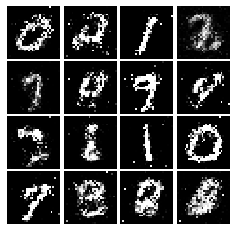

Epoch: 6, Iter: 2820, D: 0.2149, G:0.1855


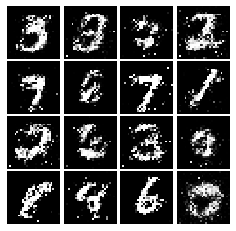

Epoch: 6, Iter: 2840, D: 0.2053, G:0.191


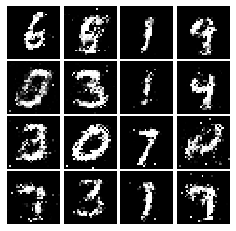

Epoch: 6, Iter: 2860, D: 0.2078, G:0.2181


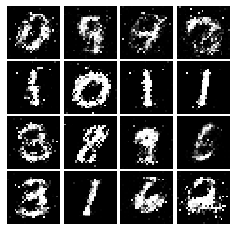

Epoch: 6, Iter: 2880, D: 0.2319, G:0.179


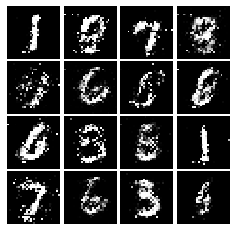

Epoch: 6, Iter: 2900, D: 0.2316, G:0.1926


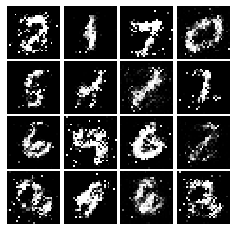

Epoch: 6, Iter: 2920, D: 0.241, G:0.179


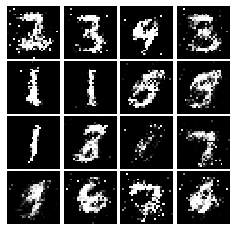

Epoch: 6, Iter: 2940, D: 0.2318, G:0.1515


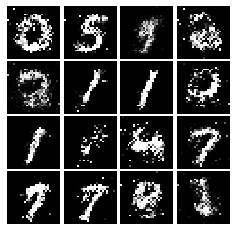

Epoch: 6, Iter: 2960, D: 0.2359, G:0.1694


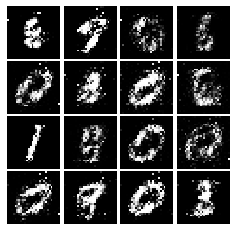

Epoch: 6, Iter: 2980, D: 0.241, G:0.159


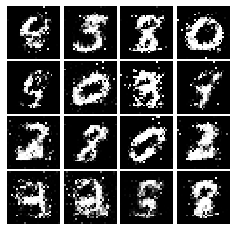

Epoch: 6, Iter: 3000, D: 0.239, G:0.1916


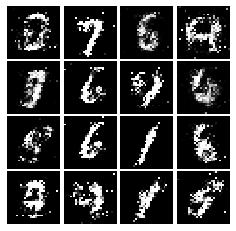

Epoch: 6, Iter: 3020, D: 0.2261, G:0.1693


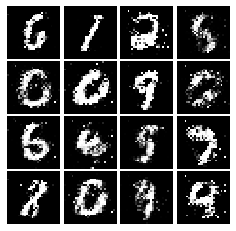

Epoch: 6, Iter: 3040, D: 0.2201, G:0.1627


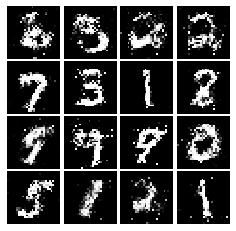

Epoch: 6, Iter: 3060, D: 0.2072, G:0.1609


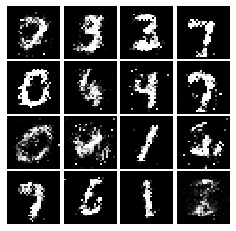

Epoch: 6, Iter: 3080, D: 0.225, G:0.1764


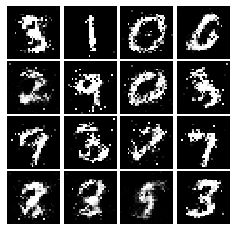

Epoch: 6, Iter: 3100, D: 0.2126, G:0.1614


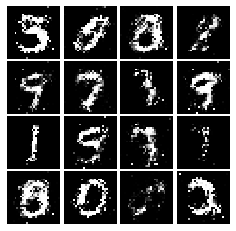

Epoch: 6, Iter: 3120, D: 0.2286, G:0.1388


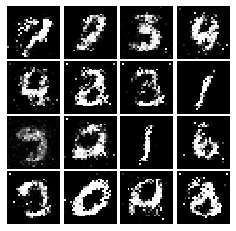

Epoch: 6, Iter: 3140, D: 0.2535, G:0.168


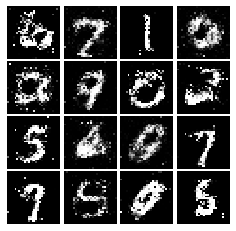

Epoch: 6, Iter: 3160, D: 0.2207, G:0.1884


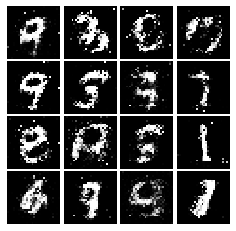

Epoch: 6, Iter: 3180, D: 0.225, G:0.1763


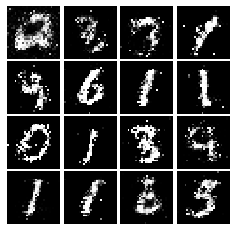

Epoch: 6, Iter: 3200, D: 0.2348, G:0.1929


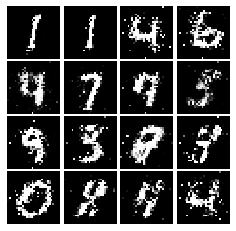

Epoch: 6, Iter: 3220, D: 0.2252, G:0.1761


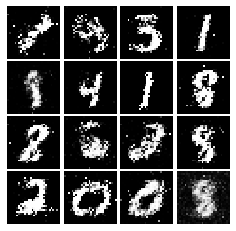

Epoch: 6, Iter: 3240, D: 0.2236, G:0.1443


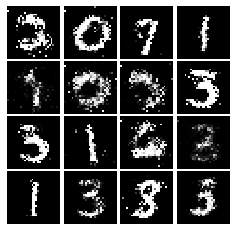

Epoch: 6, Iter: 3260, D: 0.2408, G:0.1849


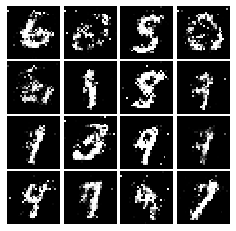

Epoch: 6, Iter: 3280, D: 0.2204, G:0.1745


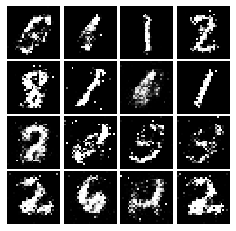

Epoch: 7, Iter: 3300, D: 0.209, G:0.1589


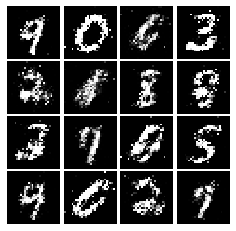

Epoch: 7, Iter: 3320, D: 0.2109, G:0.1662


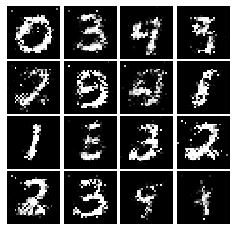

Epoch: 7, Iter: 3340, D: 0.2449, G:0.1706


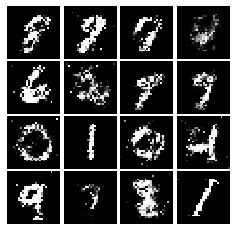

Epoch: 7, Iter: 3360, D: 0.2266, G:0.1794


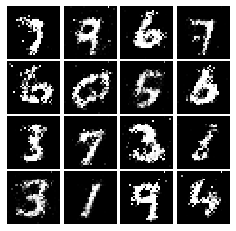

Epoch: 7, Iter: 3380, D: 0.2041, G:0.1723


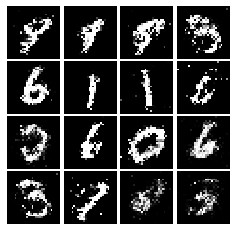

Epoch: 7, Iter: 3400, D: 0.2433, G:0.161


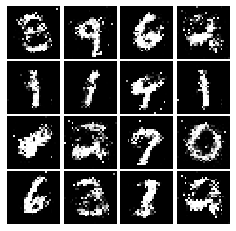

Epoch: 7, Iter: 3420, D: 0.2219, G:0.1781


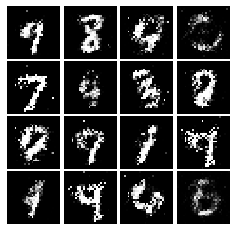

Epoch: 7, Iter: 3440, D: 0.2216, G:0.1734


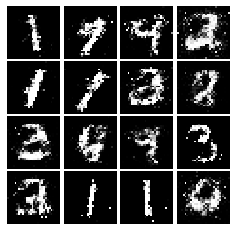

Epoch: 7, Iter: 3460, D: 0.2178, G:0.1714


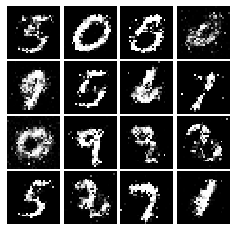

Epoch: 7, Iter: 3480, D: 0.2184, G:0.1524


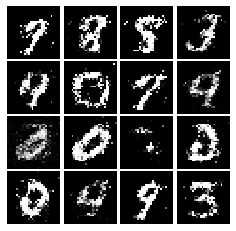

Epoch: 7, Iter: 3500, D: 0.2249, G:0.1848


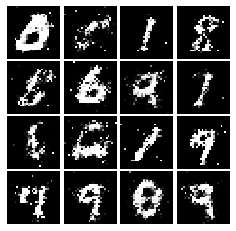

Epoch: 7, Iter: 3520, D: 0.2338, G:0.1776


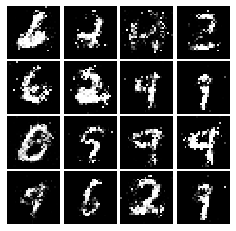

Epoch: 7, Iter: 3540, D: 0.2276, G:0.1613


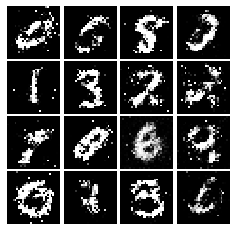

Epoch: 7, Iter: 3560, D: 0.2205, G:0.1842


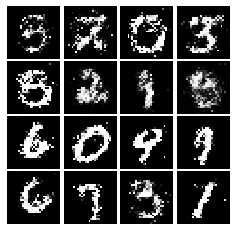

Epoch: 7, Iter: 3580, D: 0.2335, G:0.1822


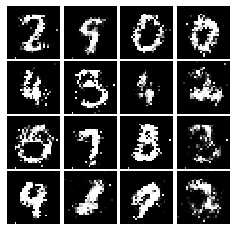

Epoch: 7, Iter: 3600, D: 0.2312, G:0.1597


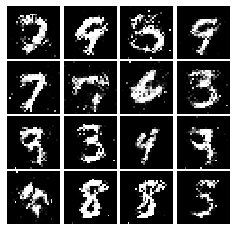

Epoch: 7, Iter: 3620, D: 0.2204, G:0.1483


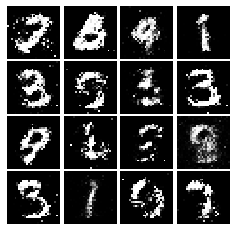

Epoch: 7, Iter: 3640, D: 0.2326, G:0.1728


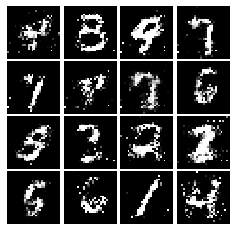

Epoch: 7, Iter: 3660, D: 0.2248, G:0.1885


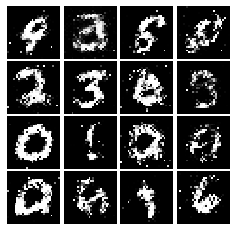

Epoch: 7, Iter: 3680, D: 0.227, G:0.1724


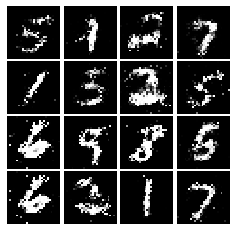

Epoch: 7, Iter: 3700, D: 0.2249, G:0.1511


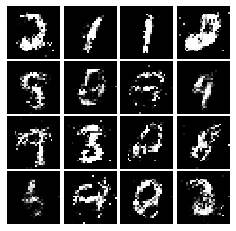

Epoch: 7, Iter: 3720, D: 0.2202, G:0.1943


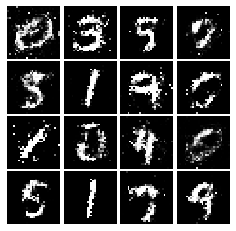

Epoch: 7, Iter: 3740, D: 0.2247, G:0.1546


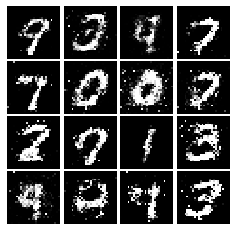

Epoch: 8, Iter: 3760, D: 0.2241, G:0.1792


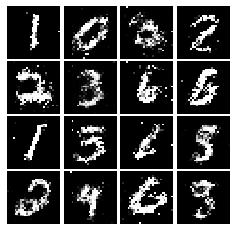

Epoch: 8, Iter: 3780, D: 0.2246, G:0.1569


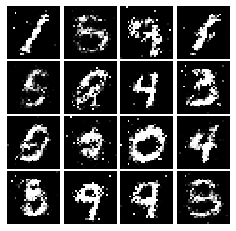

Epoch: 8, Iter: 3800, D: 0.2157, G:0.1745


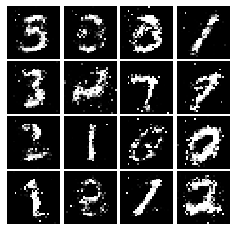

Epoch: 8, Iter: 3820, D: 0.238, G:0.1832


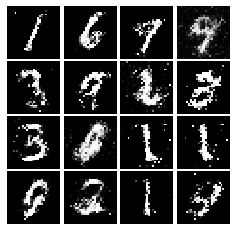

Epoch: 8, Iter: 3840, D: 0.2301, G:0.1757


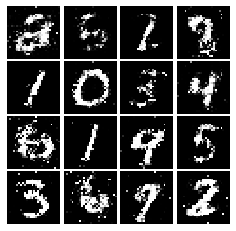

Epoch: 8, Iter: 3860, D: 0.235, G:0.1665


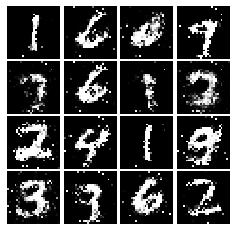

Epoch: 8, Iter: 3880, D: 0.2116, G:0.1903


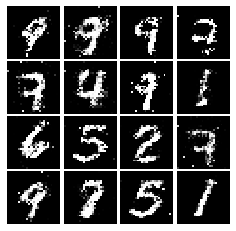

Epoch: 8, Iter: 3900, D: 0.2397, G:0.1536


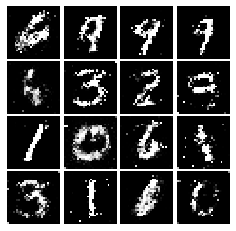

Epoch: 8, Iter: 3920, D: 0.2143, G:0.1786


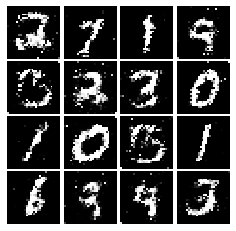

Epoch: 8, Iter: 3940, D: 0.2592, G:0.1778


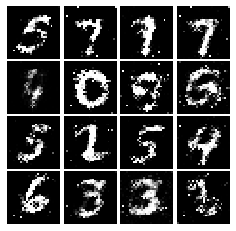

Epoch: 8, Iter: 3960, D: 0.2242, G:0.1517


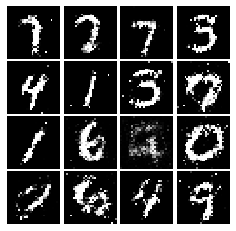

Epoch: 8, Iter: 3980, D: 0.2175, G:0.1695


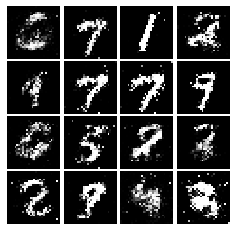

Epoch: 8, Iter: 4000, D: 0.2404, G:0.1788


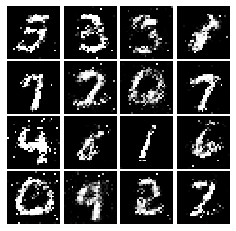

Epoch: 8, Iter: 4020, D: 0.2304, G:0.1743


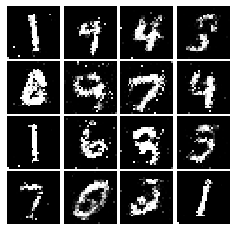

Epoch: 8, Iter: 4040, D: 0.2197, G:0.1976


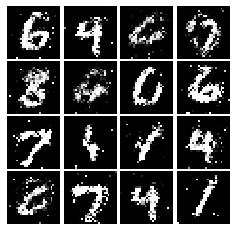

Epoch: 8, Iter: 4060, D: 0.2184, G:0.1838


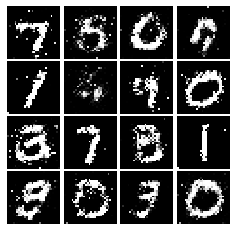

Epoch: 8, Iter: 4080, D: 0.2377, G:0.1947


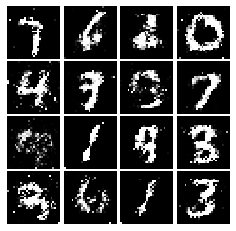

Epoch: 8, Iter: 4100, D: 0.2329, G:0.1672


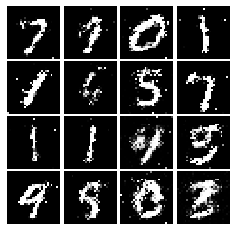

Epoch: 8, Iter: 4120, D: 0.2313, G:0.1568


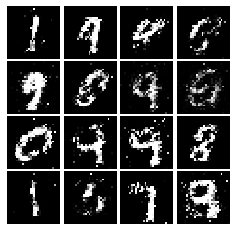

Epoch: 8, Iter: 4140, D: 0.2211, G:0.1696


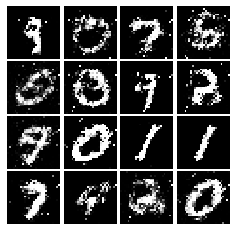

Epoch: 8, Iter: 4160, D: 0.2317, G:0.2032


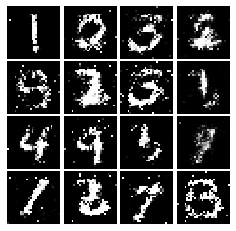

Epoch: 8, Iter: 4180, D: 0.2276, G:0.179


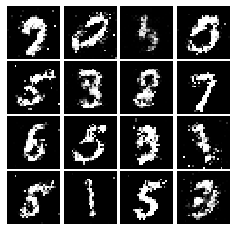

Epoch: 8, Iter: 4200, D: 0.2249, G:0.1936


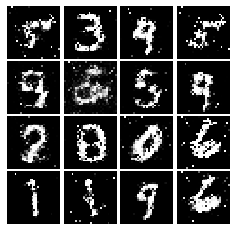

Epoch: 8, Iter: 4220, D: 0.1992, G:0.1963


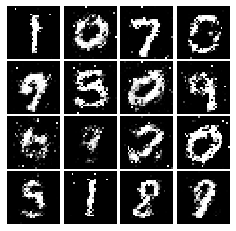

Epoch: 9, Iter: 4240, D: 0.2366, G:0.1314


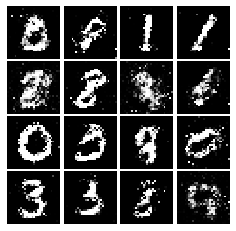

Epoch: 9, Iter: 4260, D: 0.2389, G:0.1594


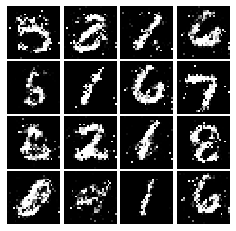

Epoch: 9, Iter: 4280, D: 0.2336, G:0.1833


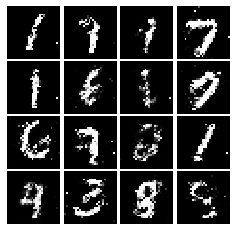

Epoch: 9, Iter: 4300, D: 0.2547, G:0.1838


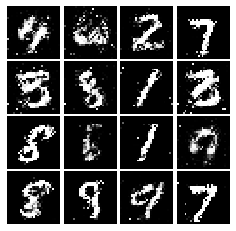

Epoch: 9, Iter: 4320, D: 0.2298, G:0.1608


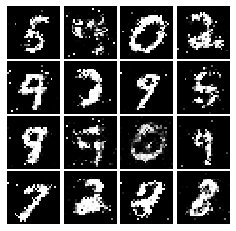

Epoch: 9, Iter: 4340, D: 0.2264, G:0.2004


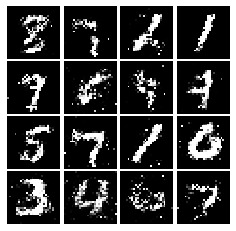

Epoch: 9, Iter: 4360, D: 0.2318, G:0.1714


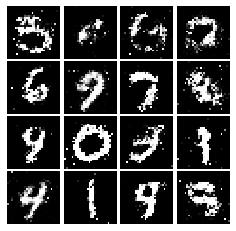

Epoch: 9, Iter: 4380, D: 0.2391, G:0.1642


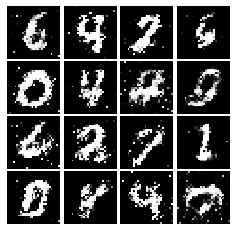

Epoch: 9, Iter: 4400, D: 0.2106, G:0.189


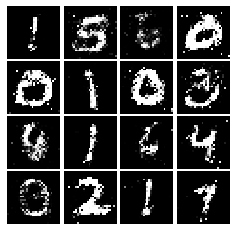

Epoch: 9, Iter: 4420, D: 0.2185, G:0.1472


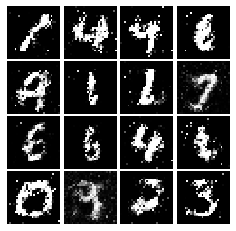

Epoch: 9, Iter: 4440, D: 0.233, G:0.1907


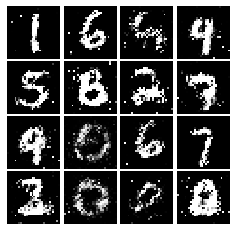

Epoch: 9, Iter: 4460, D: 0.2377, G:0.1698


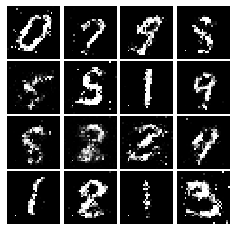

Epoch: 9, Iter: 4480, D: 0.2396, G:0.1868


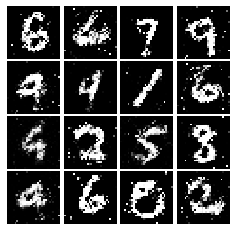

Epoch: 9, Iter: 4500, D: 0.2487, G:0.1372


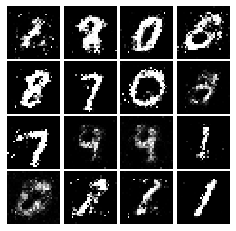

Epoch: 9, Iter: 4520, D: 0.24, G:0.1589


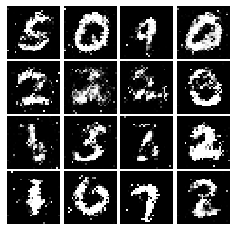

Epoch: 9, Iter: 4540, D: 0.2448, G:0.1607


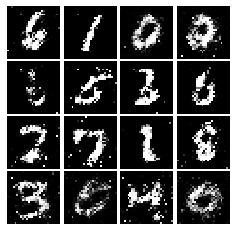

Epoch: 9, Iter: 4560, D: 0.2154, G:0.1543


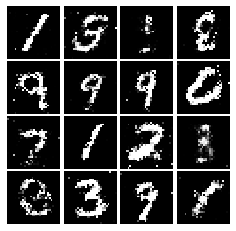

Epoch: 9, Iter: 4580, D: 0.2276, G:0.1835


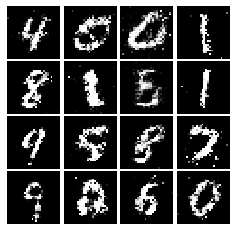

Epoch: 9, Iter: 4600, D: 0.2475, G:0.1454


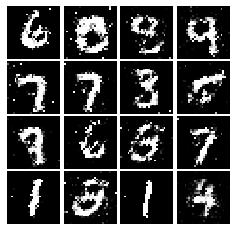

Epoch: 9, Iter: 4620, D: 0.2161, G:0.1872


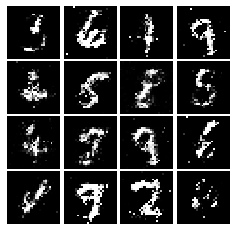

Epoch: 9, Iter: 4640, D: 0.2377, G:0.1748


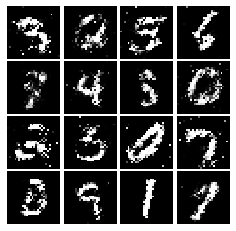

Epoch: 9, Iter: 4660, D: 0.228, G:0.1646


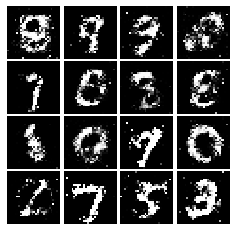

Epoch: 9, Iter: 4680, D: 0.2444, G:0.1791


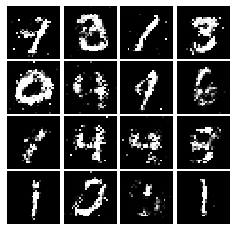

Final images


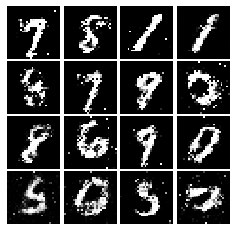

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [22]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32, (5,5),strides=(1, 1), padding='valid', use_bias = True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2), 2),
        tf.keras.layers.Conv2D(64, (5,5),strides=(1, 1), padding='valid', use_bias = True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2), 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64, use_bias = True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1, use_bias = True)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024, use_bias = True, activation = "relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7 *7 * 128, use_bias = True, activation = "relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(64,(4, 4), strides=2,padding='same', activation = "relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1,(4, 4), strides=2,padding='same', activation = "tanh")
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.458, G:0.6512


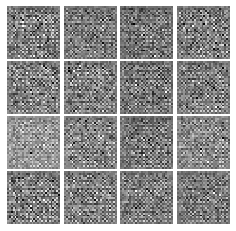

Epoch: 0, Iter: 20, D: 0.5445, G:0.4584


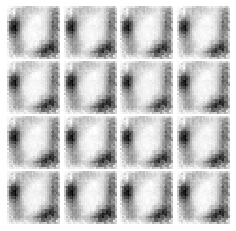

Epoch: 0, Iter: 40, D: 1.387, G:1.314


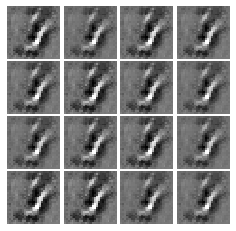

Epoch: 0, Iter: 60, D: 0.04996, G:3.515


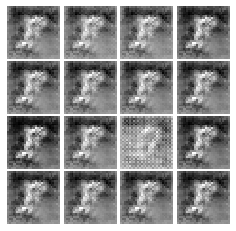

Epoch: 0, Iter: 80, D: 0.8004, G:4.517


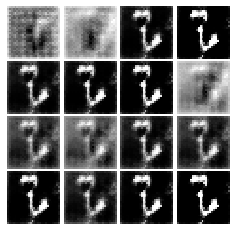

Epoch: 0, Iter: 100, D: 0.1613, G:3.618


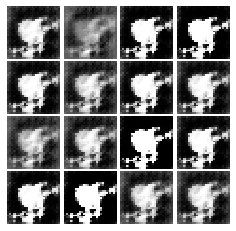

Epoch: 0, Iter: 120, D: 0.1438, G:4.436


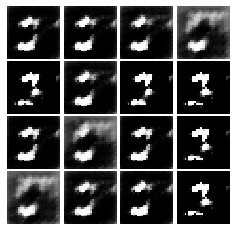

Epoch: 0, Iter: 140, D: 0.5207, G:5.559


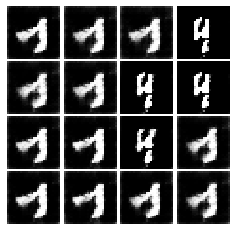

Epoch: 0, Iter: 160, D: 1.009, G:3.574


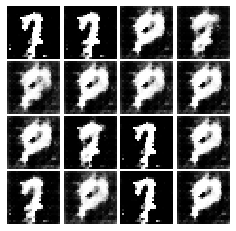

Epoch: 0, Iter: 180, D: 1.424, G:5.714


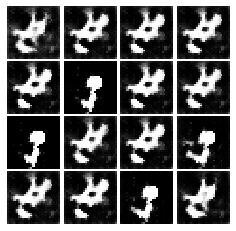

Epoch: 0, Iter: 200, D: 0.7697, G:2.687


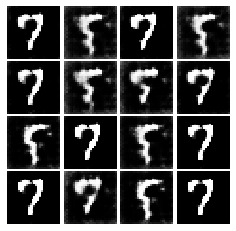

Epoch: 0, Iter: 220, D: 0.3214, G:3.093


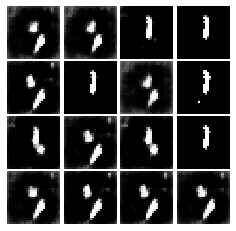

Epoch: 0, Iter: 240, D: 0.5443, G:2.52


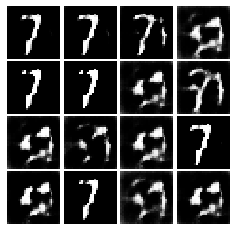

Epoch: 0, Iter: 260, D: 0.6958, G:2.915


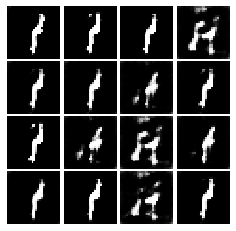

Epoch: 0, Iter: 280, D: 0.7382, G:1.721


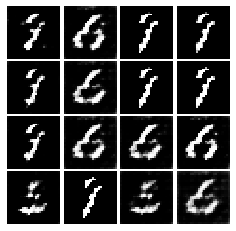

Epoch: 0, Iter: 300, D: 1.609, G:13.11


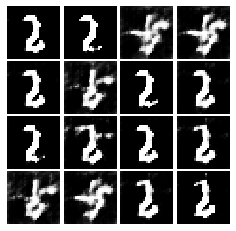

Epoch: 0, Iter: 320, D: 0.3597, G:5.149


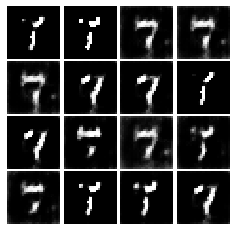

Epoch: 0, Iter: 340, D: 0.4998, G:2.538


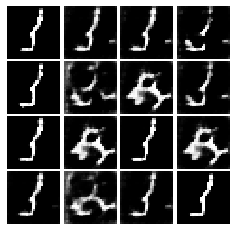

Epoch: 0, Iter: 360, D: 0.5973, G:2.321


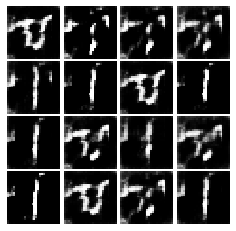

Epoch: 0, Iter: 380, D: 0.7652, G:1.325


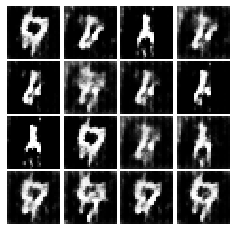

Epoch: 0, Iter: 400, D: 0.3799, G:3.375


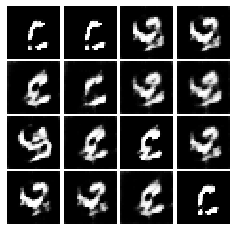

Epoch: 0, Iter: 420, D: 0.5341, G:1.606


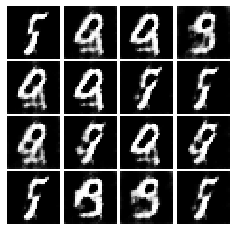

Epoch: 0, Iter: 440, D: 0.6295, G:2.302


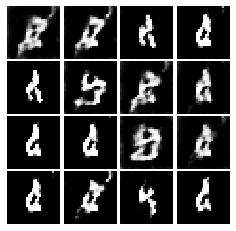

Epoch: 0, Iter: 460, D: 1.58, G:2.866


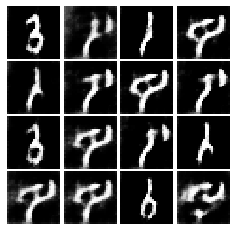

Epoch: 1, Iter: 480, D: 0.4118, G:2.853


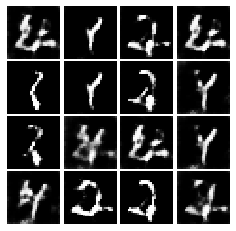

Epoch: 1, Iter: 500, D: 0.627, G:1.93


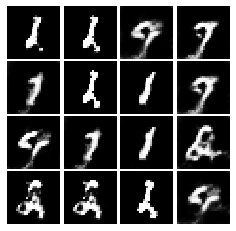

Epoch: 1, Iter: 520, D: 0.3261, G:2.968


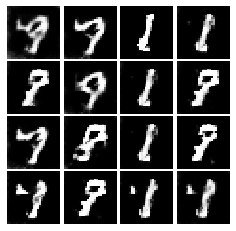

Epoch: 1, Iter: 540, D: 0.2607, G:2.669


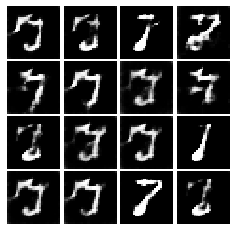

Epoch: 1, Iter: 560, D: 0.6806, G:2.164


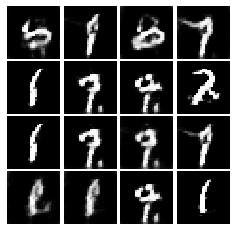

Epoch: 1, Iter: 580, D: 0.4739, G:2.787


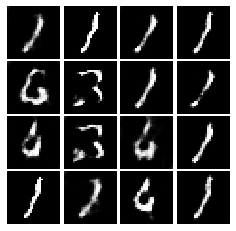

Epoch: 1, Iter: 600, D: 0.5215, G:4.187


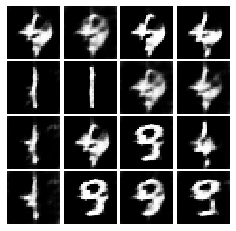

Epoch: 1, Iter: 620, D: 0.8505, G:3.798


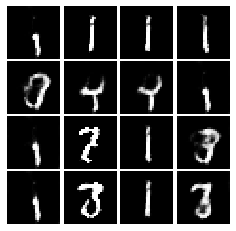

Epoch: 1, Iter: 640, D: 0.7935, G:3.25


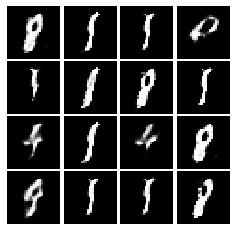

Epoch: 1, Iter: 660, D: 0.2619, G:2.877


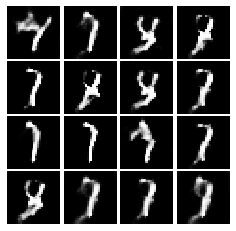

Epoch: 1, Iter: 680, D: 0.5055, G:2.767


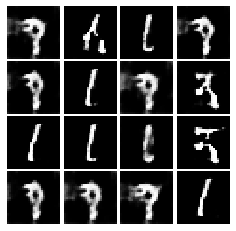

Epoch: 1, Iter: 700, D: 0.6399, G:2.839


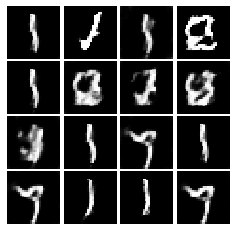

Epoch: 1, Iter: 720, D: 0.667, G:4.713


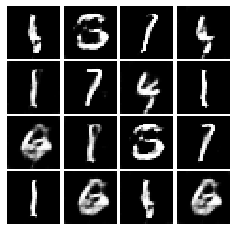

Epoch: 1, Iter: 740, D: 0.5699, G:2.525


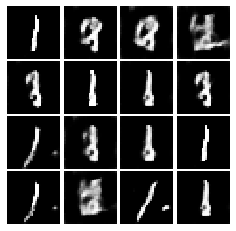

Epoch: 1, Iter: 760, D: 0.5908, G:2.465


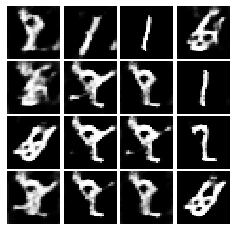

Epoch: 1, Iter: 780, D: 0.5366, G:1.75


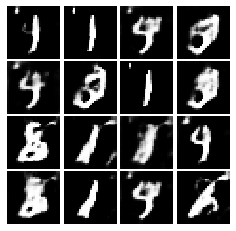

Epoch: 1, Iter: 800, D: 0.6324, G:2.343


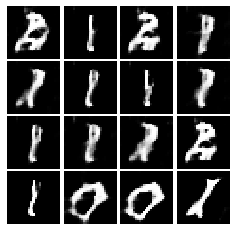

Epoch: 1, Iter: 820, D: 0.5712, G:3.041


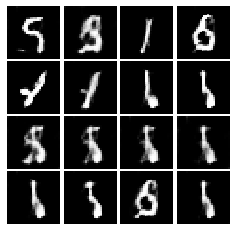

Epoch: 1, Iter: 840, D: 0.7528, G:2.724


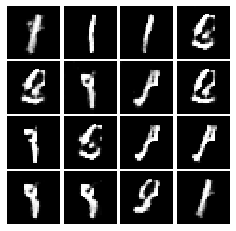

Epoch: 1, Iter: 860, D: 0.4576, G:2.194


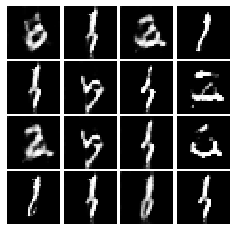

Epoch: 1, Iter: 880, D: 0.5313, G:3.938


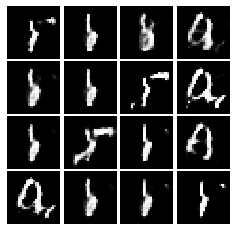

Epoch: 1, Iter: 900, D: 0.7437, G:5.81


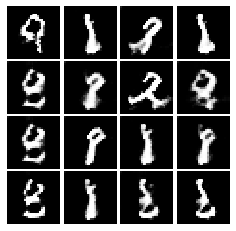

Epoch: 1, Iter: 920, D: 0.591, G:2.881


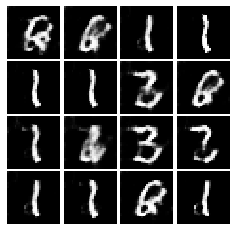

Epoch: 2, Iter: 940, D: 0.4268, G:3.052


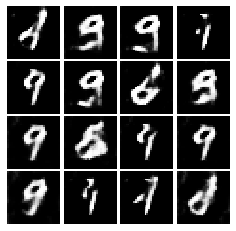

Epoch: 2, Iter: 960, D: 0.4561, G:3.363


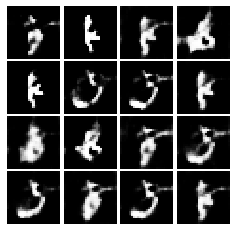

Epoch: 2, Iter: 980, D: 0.6416, G:4.313


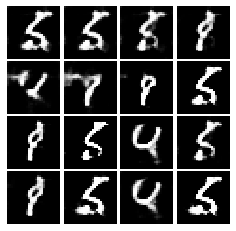

Epoch: 2, Iter: 1000, D: 2.053, G:1.252


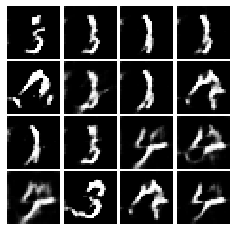

Epoch: 2, Iter: 1020, D: 0.2522, G:3.24


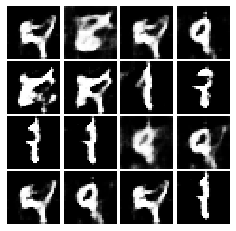

Epoch: 2, Iter: 1040, D: 0.4376, G:2.637


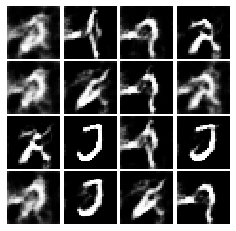

Epoch: 2, Iter: 1060, D: 0.299, G:3.351


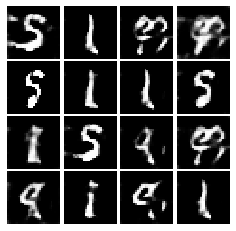

Epoch: 2, Iter: 1080, D: 0.4091, G:2.908


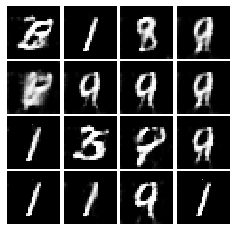

Epoch: 2, Iter: 1100, D: 0.3405, G:2.992


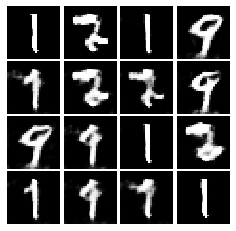

Epoch: 2, Iter: 1120, D: 0.3688, G:2.968


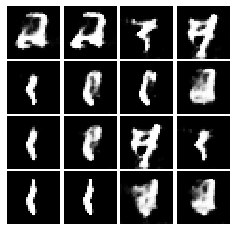

Epoch: 2, Iter: 1140, D: 0.6388, G:1.999


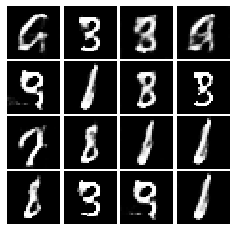

Epoch: 2, Iter: 1160, D: 0.3817, G:2.364


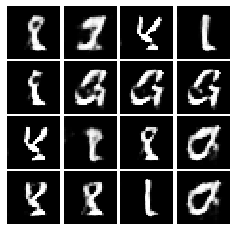

Epoch: 2, Iter: 1180, D: 0.5796, G:2.511


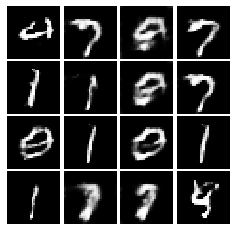

Epoch: 2, Iter: 1200, D: 0.247, G:2.748


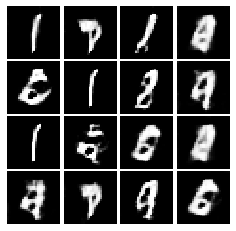

Epoch: 2, Iter: 1220, D: 0.8211, G:1.646


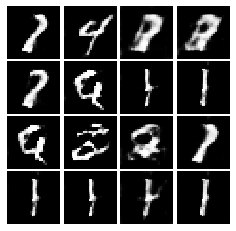

Epoch: 2, Iter: 1240, D: 0.4996, G:3.054


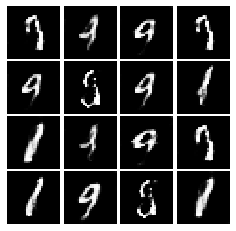

Epoch: 2, Iter: 1260, D: 0.6052, G:2.208


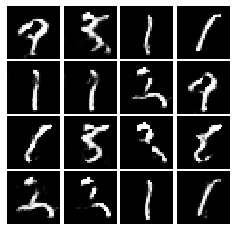

Epoch: 2, Iter: 1280, D: 0.4811, G:1.958


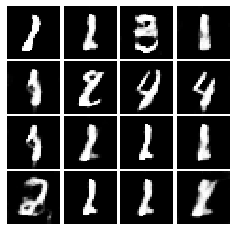

Epoch: 2, Iter: 1300, D: 0.353, G:2.808


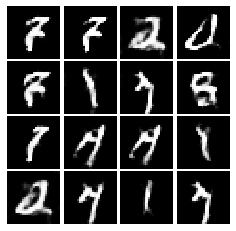

Epoch: 2, Iter: 1320, D: 0.4547, G:2.257


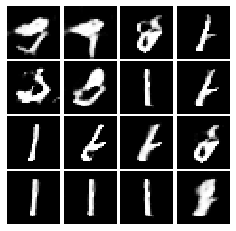

Epoch: 2, Iter: 1340, D: 0.7667, G:2.208


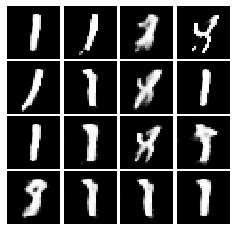

Epoch: 2, Iter: 1360, D: 0.6872, G:1.625


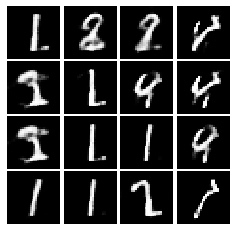

Epoch: 2, Iter: 1380, D: 0.4906, G:2.236


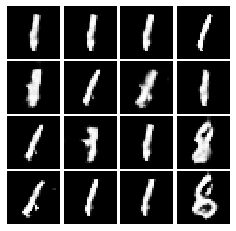

Epoch: 2, Iter: 1400, D: 0.327, G:2.437


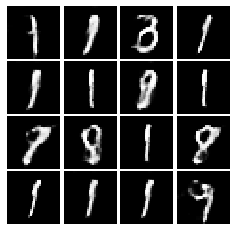

Epoch: 3, Iter: 1420, D: 0.4716, G:2.177


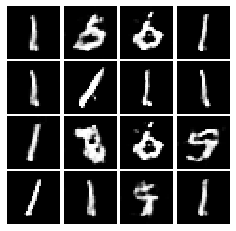

Epoch: 3, Iter: 1440, D: 0.4447, G:2.072


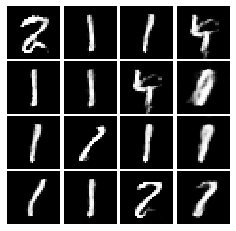

Epoch: 3, Iter: 1460, D: 0.5263, G:2.386


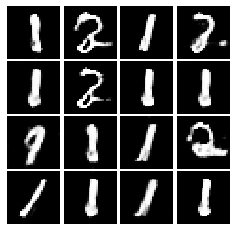

Epoch: 3, Iter: 1480, D: 0.3948, G:3.14


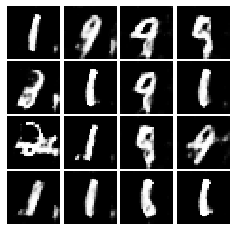

Epoch: 3, Iter: 1500, D: 0.3929, G:1.945


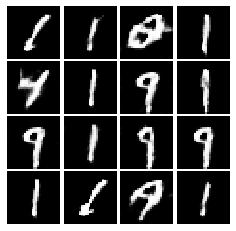

Epoch: 3, Iter: 1520, D: 0.41, G:2.807


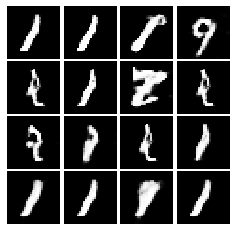

Epoch: 3, Iter: 1540, D: 0.4635, G:2.351


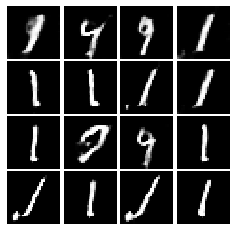

Epoch: 3, Iter: 1560, D: 0.482, G:2.856


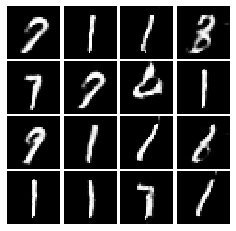

Epoch: 3, Iter: 1580, D: 0.508, G:2.079


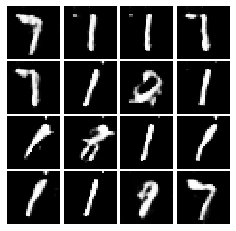

Epoch: 3, Iter: 1600, D: 0.6593, G:2.185


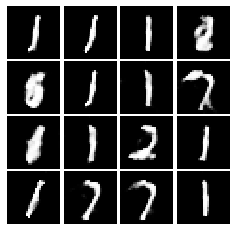

Epoch: 3, Iter: 1620, D: 0.3841, G:2.418


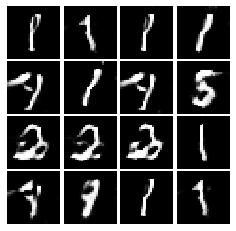

Epoch: 3, Iter: 1640, D: 0.3926, G:2.802


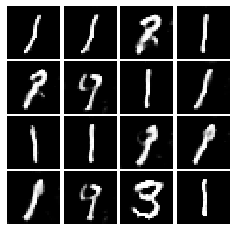

Epoch: 3, Iter: 1660, D: 0.5667, G:2.057


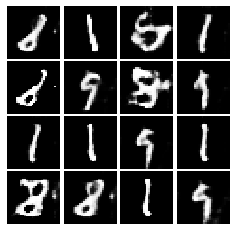

Epoch: 3, Iter: 1680, D: 0.4673, G:2.576


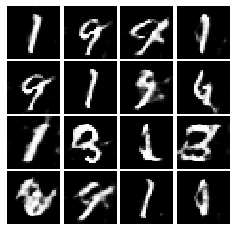

Epoch: 3, Iter: 1700, D: 0.4627, G:2.586


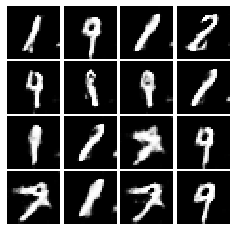

Epoch: 3, Iter: 1720, D: 0.5093, G:2.596


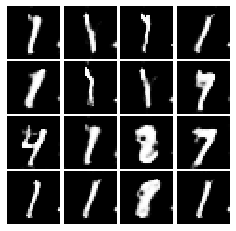

Epoch: 3, Iter: 1740, D: 0.584, G:2.018


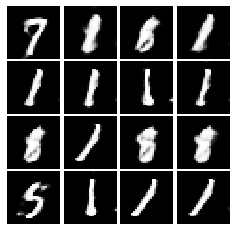

Epoch: 3, Iter: 1760, D: 0.2502, G:2.833


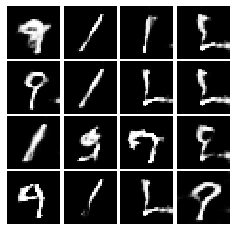

Epoch: 3, Iter: 1780, D: 0.4788, G:2.104


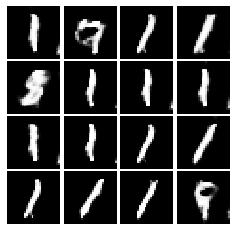

Epoch: 3, Iter: 1800, D: 0.5811, G:2.266


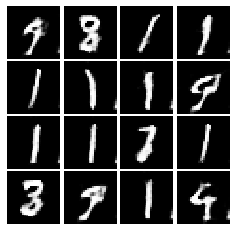

Epoch: 3, Iter: 1820, D: 0.6663, G:2.439


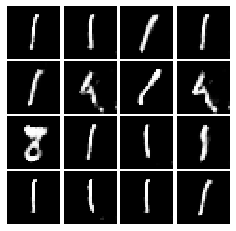

Epoch: 3, Iter: 1840, D: 0.5128, G:2.691


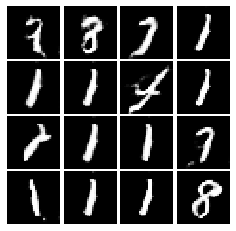

Epoch: 3, Iter: 1860, D: 0.3837, G:2.109


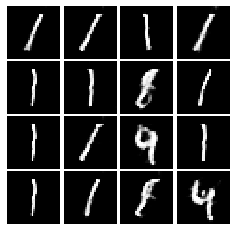

Epoch: 4, Iter: 1880, D: 0.3366, G:2.859


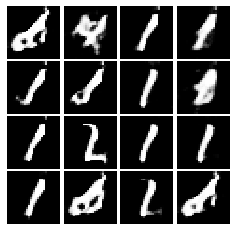

Epoch: 4, Iter: 1900, D: 0.3942, G:2.511


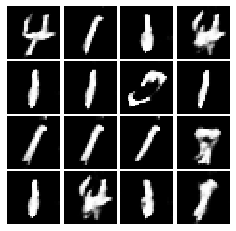

Epoch: 4, Iter: 1920, D: 0.5707, G:2.091


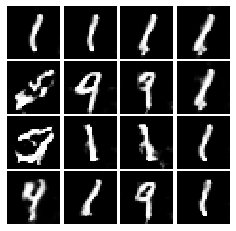

Epoch: 4, Iter: 1940, D: 0.2784, G:3.165


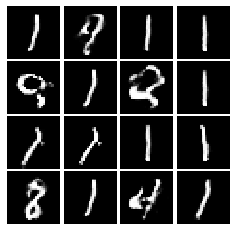

Epoch: 4, Iter: 1960, D: 0.4325, G:3.083


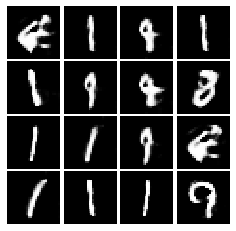

Epoch: 4, Iter: 1980, D: 0.3614, G:2.306


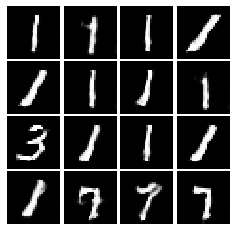

Epoch: 4, Iter: 2000, D: 0.6854, G:2.017


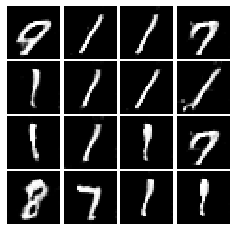

Epoch: 4, Iter: 2020, D: 0.5232, G:3.019


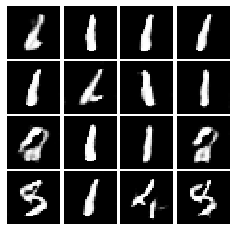

Epoch: 4, Iter: 2040, D: 0.6057, G:2.245


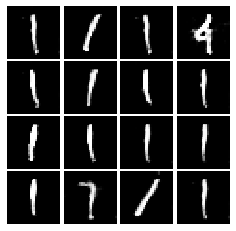

Epoch: 4, Iter: 2060, D: 0.3872, G:2.257


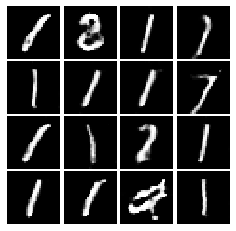

Epoch: 4, Iter: 2080, D: 0.4671, G:2.308


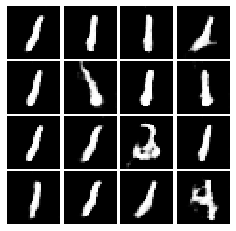

Epoch: 4, Iter: 2100, D: 0.4217, G:2.345


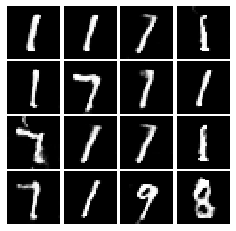

Epoch: 4, Iter: 2120, D: 0.5597, G:1.853


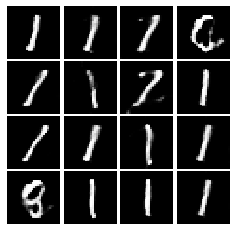

Epoch: 4, Iter: 2140, D: 0.4634, G:2.16


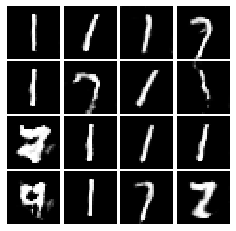

Epoch: 4, Iter: 2160, D: 0.5848, G:2.139


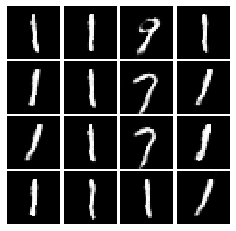

Epoch: 4, Iter: 2180, D: 0.5841, G:3.693


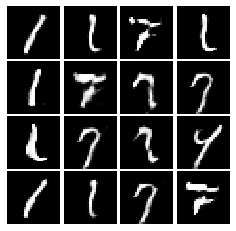

Epoch: 4, Iter: 2200, D: 0.4093, G:2.139


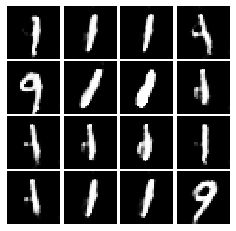

Epoch: 4, Iter: 2220, D: 0.4329, G:2.427


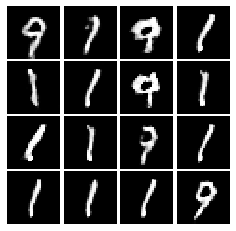

Epoch: 4, Iter: 2240, D: 0.4358, G:2.552


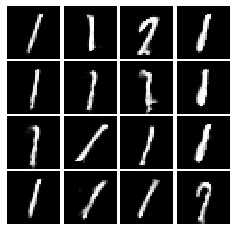

Epoch: 4, Iter: 2260, D: 0.4247, G:2.812


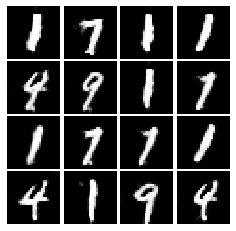

Epoch: 4, Iter: 2280, D: 0.4105, G:2.422


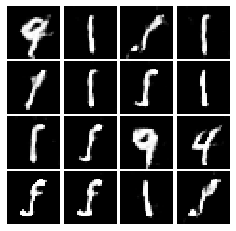

Epoch: 4, Iter: 2300, D: 0.4752, G:2.166


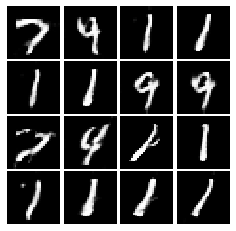

Epoch: 4, Iter: 2320, D: 0.3892, G:2.293


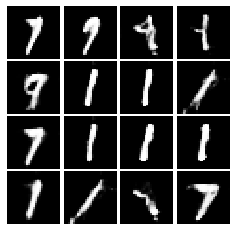

Epoch: 4, Iter: 2340, D: 0.3278, G:2.47


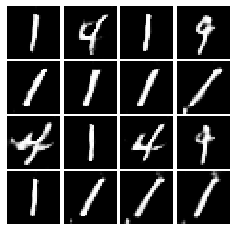

Final images


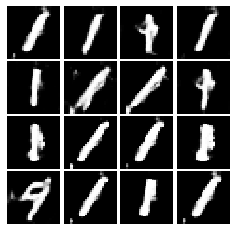

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |   -1  |  -2   |   -1  |  1     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -1  |   -2  |   -1  |  1    |   2   |  1     
   
gradient apskaičiavimas grad f(x, y) = <y, x>
y(i + 1) = y(i) + grad(y(i)) * learning_rate
x(i + 1) = x(i) - grad(y(i + 1)) * learning_rate

   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
Ne, nes matome, kad po kažkiek laiko reikšmės pradeda atsikartoti.


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
Ne, nes discriminatorius nesimokina atskirti tikrų vaizdų nuo netikrų, todėl jis netikrus vaizdus gali klasifikuoti kaip tikrus, todėl generator klaida tampa mažesnė.